In [3]:
#PELT 0.1
import numpy as np
import pandas as pd
import ruptures as rpt
import time

In [5]:
# Load SWaT dataset
df = pd.read_csv("C:/Users/gutti/OneDrive/Documents/Project/Subsequences/subsequence_1.csv")  # Update with actual file path
sensor_columns = df.columns[1:]  # Ignore timestamp column

# Convert dataset to NumPy array
data = df[sensor_columns].values

# Set penalty for changepoint detection
penalty_value = 0.1  # Adjust as needed

# Dictionary to store detected changepoints for each sensor
event_dict_0_1 = {}

start_time = time.time()  # Track execution time


In [7]:
# Apply PELT on each column
for i, col in enumerate(sensor_columns):
    sensor_data = data[:, i]
    
    # Skip columns with constant values (no changes)
    if np.all(sensor_data == sensor_data[0]):
        event_dict_0_1[col] = []
        continue

    # Apply PELT
    algo = rpt.Pelt(model="l2", min_size=10, jump=10).fit(sensor_data)
    changepoints = algo.predict(pen=penalty_value)
    
    # Store detected changepoints (excluding last index)
    event_dict_0_1[col] = changepoints[:-1]

    # Print progress 
    print(f"Processed {col} - {len(changepoints)-1} events detected")

Processed 1 - 456 events detected
Processed 2 - 11 events detected
Processed 3 - 5 events detected
Processed 4 - 3 events detected
Processed 5 - 31 events detected
Processed 6 - 4 events detected
Processed 7 - 125 events detected
Processed 8 - 10 events detected
Processed 9 - 8 events detected
Processed 12 - 4 events detected
Processed 14 - 4 events detected
Processed 16 - 36 events detected
Processed 17 - 12 events detected
Processed 18 - 429 events detected
Processed 19 - 4 events detected
Processed 20 - 11 events detected
Processed 21 - 5 events detected
Processed 22 - 9 events detected
Processed 24 - 8 events detected
Processed 26 - 130 events detected
Processed 27 - 0 events detected
Processed 28 - 466 events detected
Processed 34 - 0 events detected
Processed 35 - 116 events detected
Processed 36 - 88 events detected
Processed 37 - 38 events detected
Processed 38 - 0 events detected
Processed 39 - 0 events detected
Processed 40 - 0 events detected
Processed 41 - 0 events detected

In [9]:
end_time = time.time()  # Stop tracking execution time
print(f"\nTotal execution time: {end_time - start_time:.2f} seconds\n")

# Display resultsevent_dict
for col, changepoints in event_dict_0_1.items():
    print(f"{col}: {changepoints}")


Total execution time: 853.85 seconds

1: [10, 20, 30, 40, 60, 70, 80, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 520, 530, 540, 550, 560, 570, 580, 590, 600, 610, 620, 630, 640, 650, 660, 670, 680, 690, 700, 710, 720, 730, 740, 750, 760, 770, 780, 790, 800, 810, 820, 830, 840, 850, 860, 870, 880, 890, 900, 910, 920, 930, 940, 950, 960, 970, 980, 990, 1000, 1010, 1020, 1030, 1040, 1050, 1060, 1070, 1080, 1090, 1100, 1110, 1120, 1130, 1140, 1150, 1160, 1170, 1180, 1190, 1200, 1210, 1220, 1230, 1240, 1250, 1260, 1270, 1280, 1290, 1300, 1310, 1320, 1330, 1340, 1350, 1360, 1370, 1380, 1390, 1400, 1420, 1450, 1460, 1480, 1490, 1500, 1510, 1530, 1550, 1560, 1570, 1580, 1600, 1610, 1620, 1630, 1640, 1650, 1670, 1680, 1690, 1700, 1730, 1750, 1760, 1770, 1780, 1790, 1800, 1810, 1820, 1830, 1840, 1850, 1860, 1870, 1880, 1890, 1900, 1910, 192

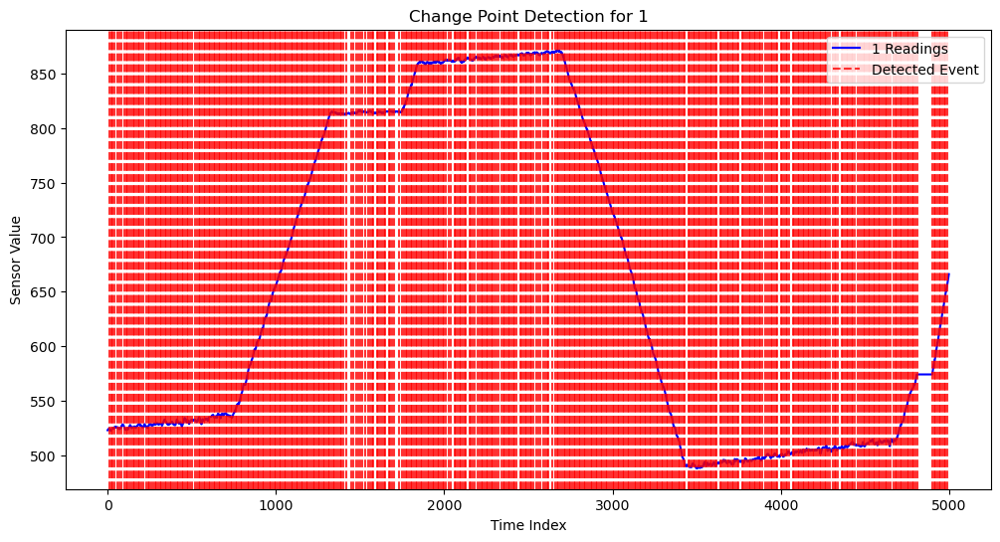

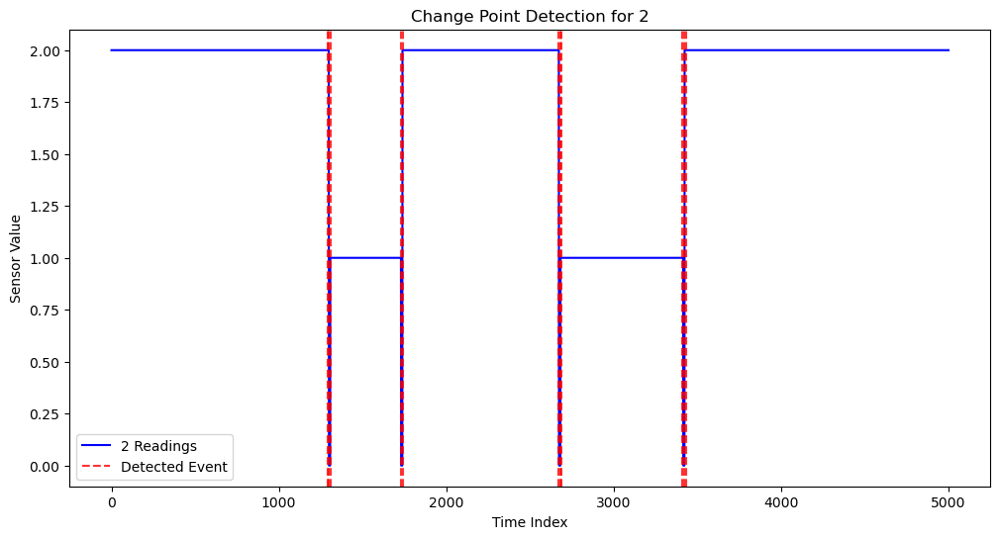

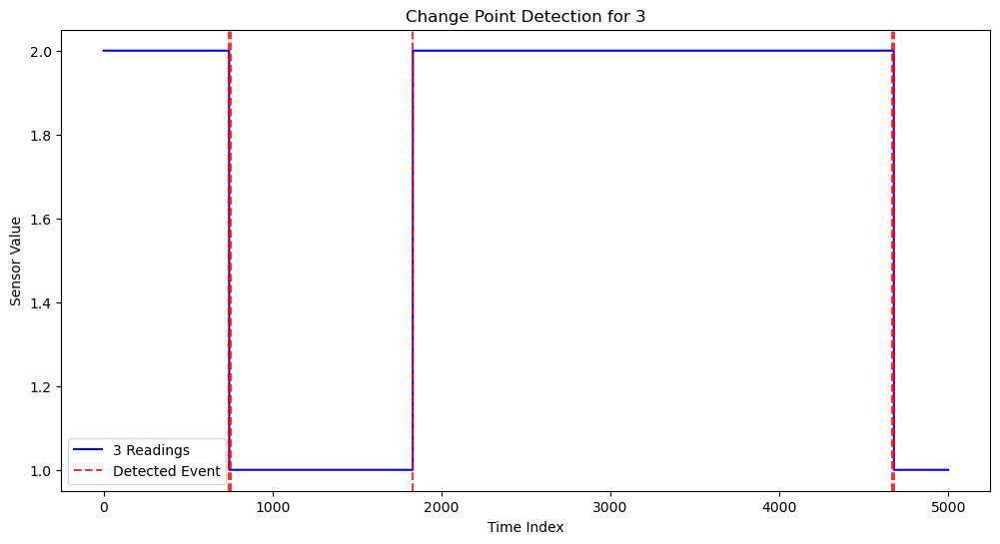

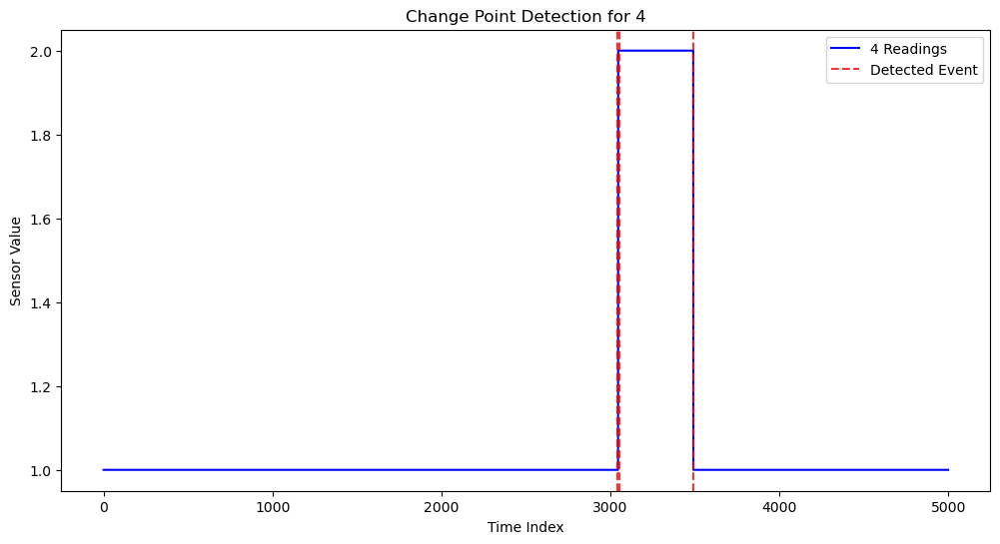

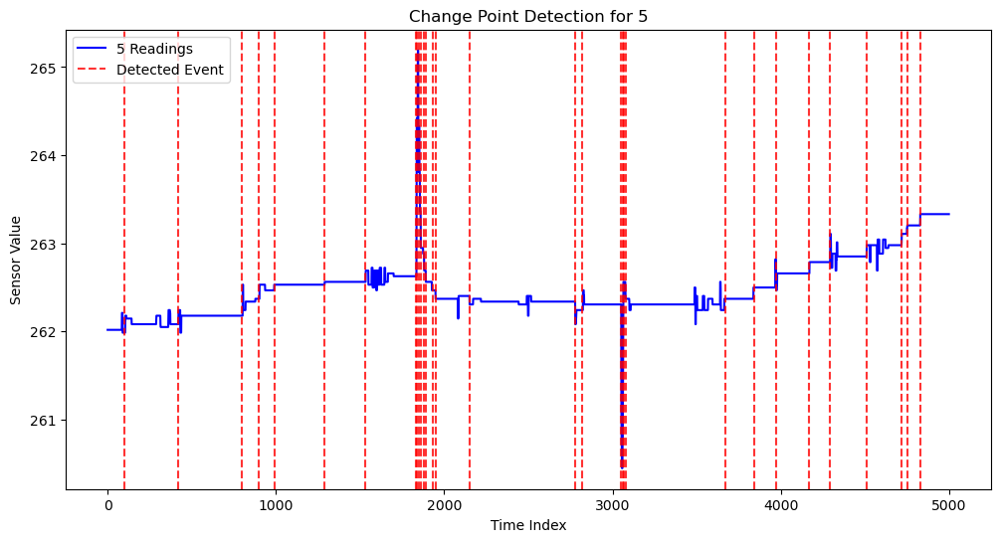

...

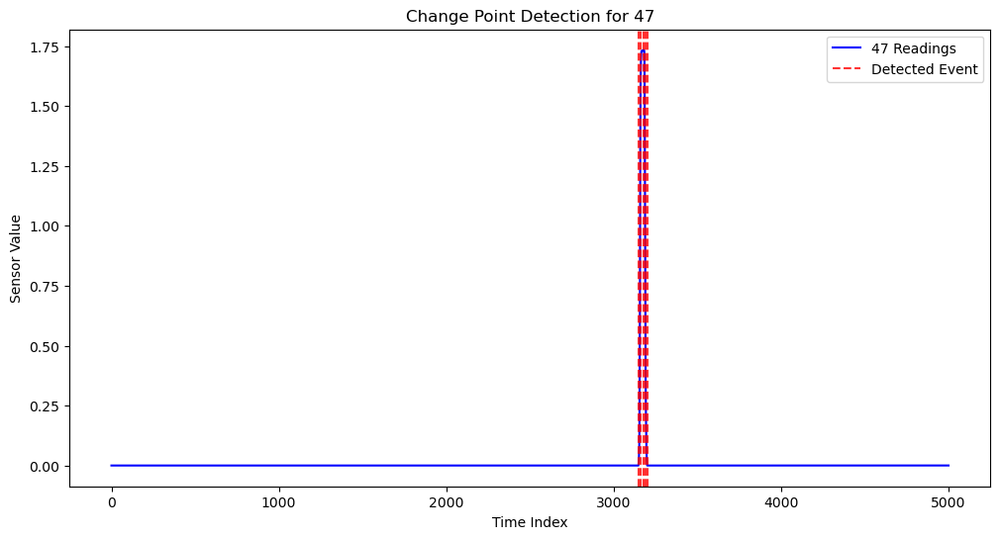

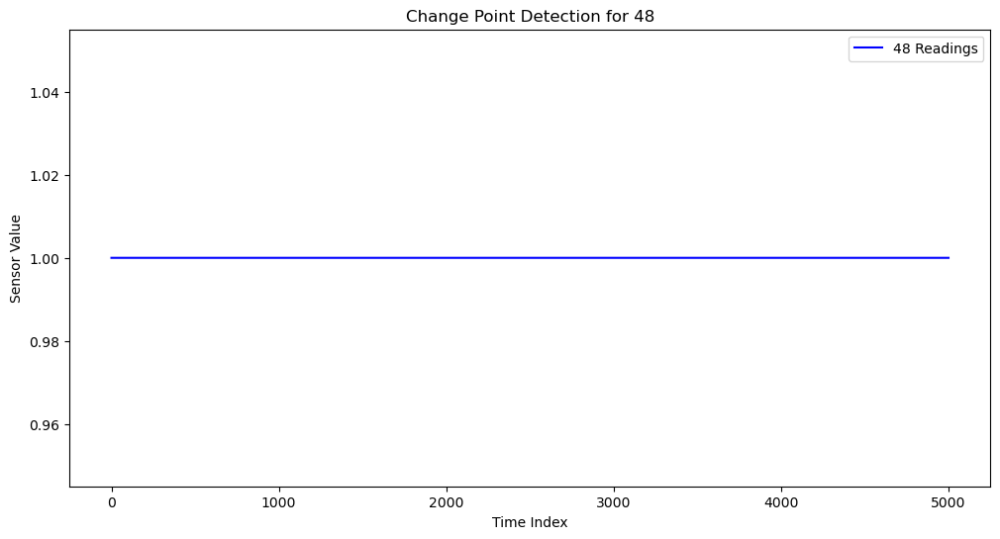

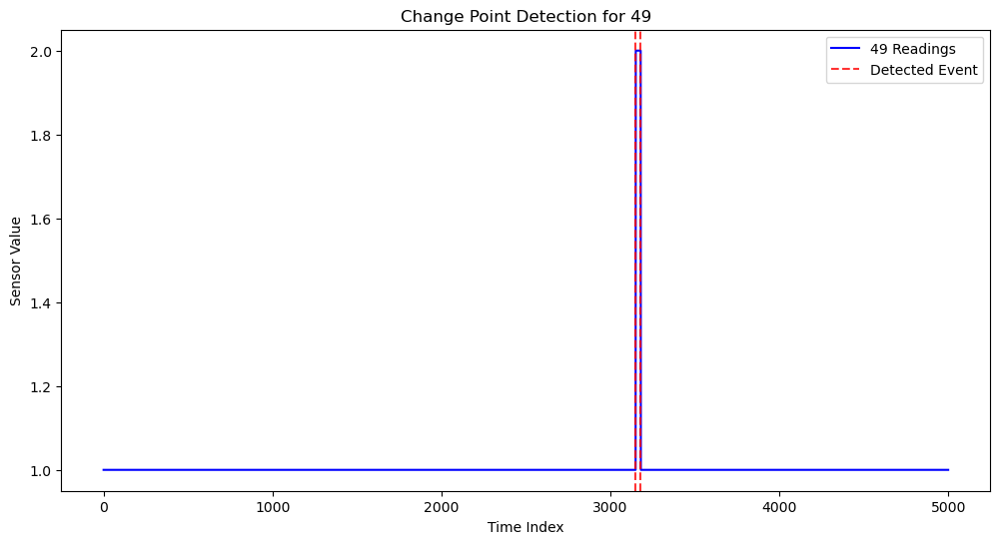

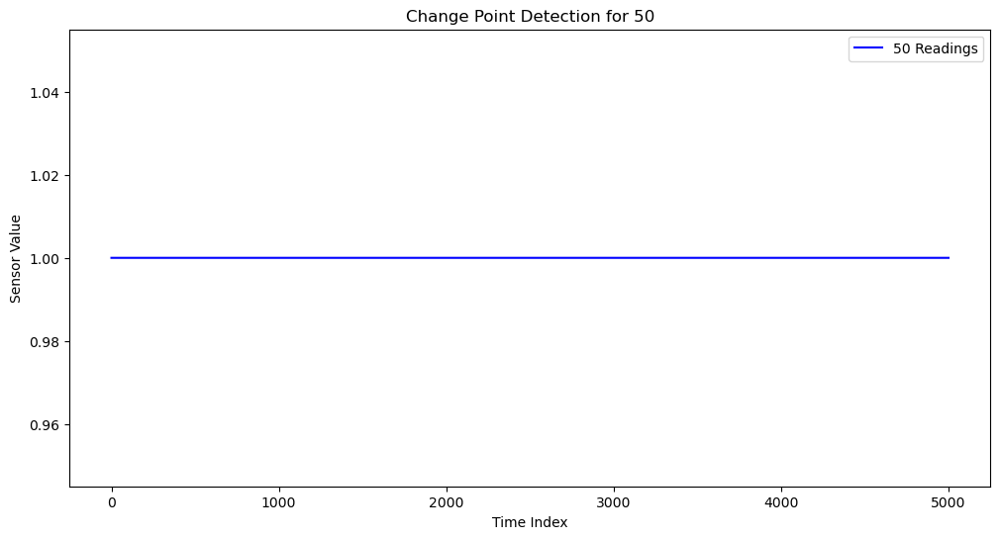

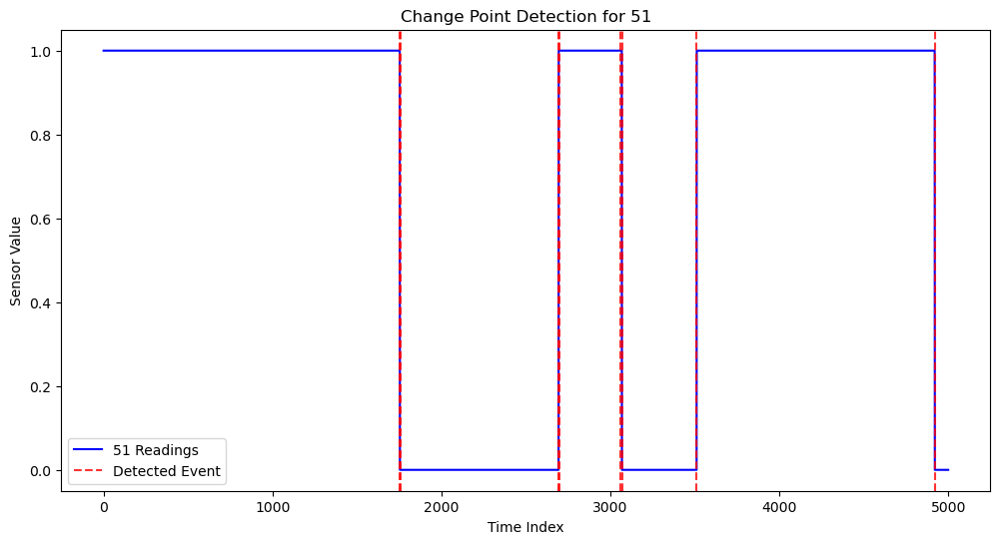

In [62]:
import matplotlib.pyplot as plt

def plot_each_sensor_separately(df, event_dict_0_1):
    """
    Plots detected changepoints for each sensor in separate figures.
    """
    for sensor_name in event_dict_0_1:
        sensor_data = df[sensor_name].values
        changepoints = event_dict_0_1[sensor_name]

        plt.figure(figsize=(12, 6))
        plt.plot(sensor_data, label=f"{sensor_name} Readings", color="blue")

        # Mark detected changepoints
        for cp in changepoints:
            plt.axvline(cp, color="red", linestyle="dashed", alpha=0.8, label="Detected Event" if cp == changepoints[0] else "")

        plt.title(f"Change Point Detection for {sensor_name}")
        plt.xlabel("Time Index")
        plt.ylabel("Sensor Value")
        plt.legend()
        plt.show()

# Call the function to generate separate plots for each sensor
plot_each_sensor_separately(df, event_dict_0_1)


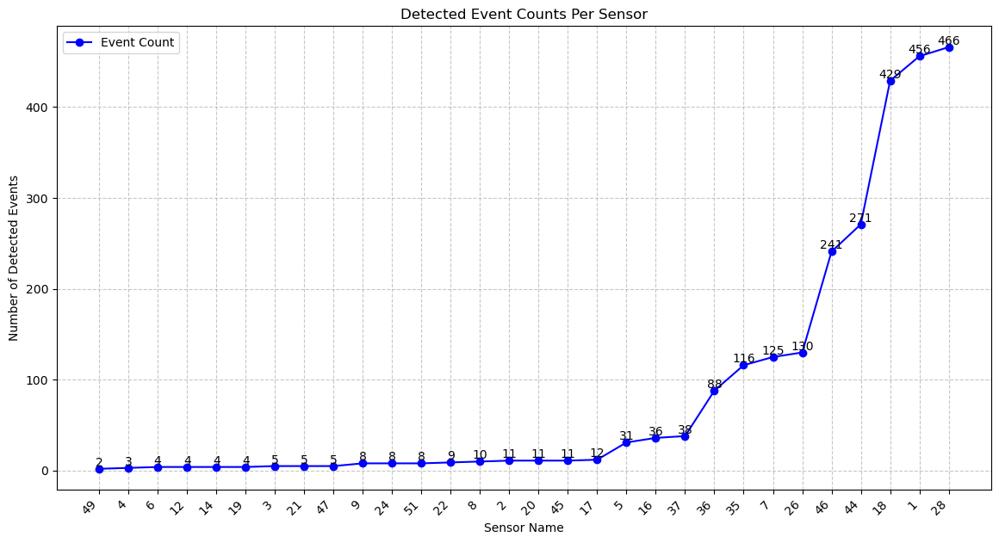

In [11]:
import matplotlib.pyplot as plt

def plot_event_line_graph(event_dict_0_1):
    """
    Plots a line graph showing the number of detected events for each sensor.
    """
    # Filter out sensors with no detected events
    event_counts = {sensor: len(changepoints) for sensor, changepoints in event_dict_0_1.items() if len(changepoints) > 0}

    if not event_counts:
        print("No sensors with detected events.")
        return

    # Sort sensors by event count for better visualization
    sorted_sensors = sorted(event_counts, key=event_counts.get)
    sorted_counts = [event_counts[sensor] for sensor in sorted_sensors]

    # Plot the line graph
    plt.figure(figsize=(14,7))
    plt.plot(sorted_sensors, sorted_counts, marker='o', linestyle='-', color='b', markersize=6, label="Event Count")

    # Highlight each point
    for i, count in enumerate(sorted_counts):
        plt.text(i, count, str(count), ha='center', va='bottom', fontsize=10, color='black')

    # Formatting
    plt.xlabel("Sensor Name")
    plt.ylabel("Number of Detected Events")
    plt.title("Detected Event Counts Per Sensor")
    plt.xticks(rotation=45, ha="right")  # Rotate labels for better readability
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.show()

# Call the function to generate the line graph
plot_event_line_graph(event_dict_0_1)


In [13]:
#PELT 0.01
import numpy as np
import pandas as pd
import ruptures as rpt
import time

In [15]:
# Load SWaT dataset
df = pd.read_csv("C:/Users/gutti/OneDrive/Documents/Project/Subsequences/subsequence_1.csv")  # Update with actual file path
sensor_columns = df.columns[1:]  # Ignore timestamp column

# Convert dataset to NumPy array
data = df[sensor_columns].values

# Set penalty for changepoint detection
penalty_value = 0.01  # Adjust as needed

# Dictionary to store detected changepoints for each sensor
event_dict_0_01 = {}

start_time = time.time()  # Track execution time


In [17]:
# Apply PELT on each column
for i, col in enumerate(sensor_columns):
    sensor_data = data[:, i]
    
    # Skip columns with constant values (no changes)
    if np.all(sensor_data == sensor_data[0]):
       event_dict_0_01[col] = []
       continue

    # Apply PELT
    algo = rpt.Pelt(model="l2", min_size=10, jump=10).fit(sensor_data)
    changepoints = algo.predict(pen=penalty_value)
    
    # Store detected changepoints (excluding last index)
    event_dict_0_01[col] = changepoints[:-1]

    # Print progress
    print(f"Processed {col} - {len(changepoints)-1} events detected")

Processed 1 - 482 events detected
Processed 2 - 11 events detected
Processed 3 - 6 events detected
Processed 4 - 4 events detected
Processed 5 - 92 events detected
Processed 6 - 6 events detected
Processed 7 - 243 events detected
Processed 8 - 14 events detected
Processed 9 - 8 events detected
Processed 12 - 4 events detected
Processed 14 - 4 events detected
Processed 16 - 198 events detected
Processed 17 - 19 events detected
Processed 18 - 469 events detected
Processed 19 - 4 events detected
Processed 20 - 11 events detected
Processed 21 - 5 events detected
Processed 22 - 9 events detected
Processed 24 - 9 events detected
Processed 26 - 289 events detected
Processed 27 - 1 events detected
Processed 28 - 486 events detected
Processed 34 - 0 events detected
Processed 35 - 280 events detected
Processed 36 - 214 events detected
Processed 37 - 198 events detected
Processed 38 - 1 events detected
Processed 39 - 2 events detected
Processed 40 - 0 events detected
Processed 41 - 0 events detec

In [19]:
end_time = time.time()  # Stop tracking execution time
print(f"\nTotal execution time: {end_time - start_time:.2f} seconds\n")

# Display results
for col, changepoints in event_dict_0_01.items():
    print(f"{col}: {changepoints}")


Total execution time: 277.79 seconds

1: [10, 20, 30, 40, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510, 520, 530, 540, 550, 560, 570, 580, 590, 600, 610, 620, 630, 640, 650, 660, 670, 680, 690, 700, 710, 720, 730, 740, 750, 760, 770, 780, 790, 800, 810, 820, 830, 840, 850, 860, 870, 880, 890, 900, 910, 920, 930, 940, 950, 960, 970, 980, 990, 1000, 1010, 1020, 1030, 1040, 1050, 1060, 1070, 1080, 1090, 1100, 1110, 1120, 1130, 1140, 1150, 1160, 1170, 1180, 1190, 1200, 1210, 1220, 1230, 1240, 1250, 1260, 1270, 1280, 1290, 1300, 1310, 1320, 1330, 1340, 1350, 1360, 1370, 1380, 1390, 1400, 1420, 1440, 1450, 1460, 1470, 1480, 1490, 1500, 1510, 1530, 1540, 1550, 1560, 1570, 1580, 1590, 1600, 1610, 1620, 1630, 1640, 1650, 1660, 1670, 1680, 1690, 1700, 1710, 1720, 1730, 1740, 1750, 1760, 1770, 1780, 1790, 1800, 1810, 1

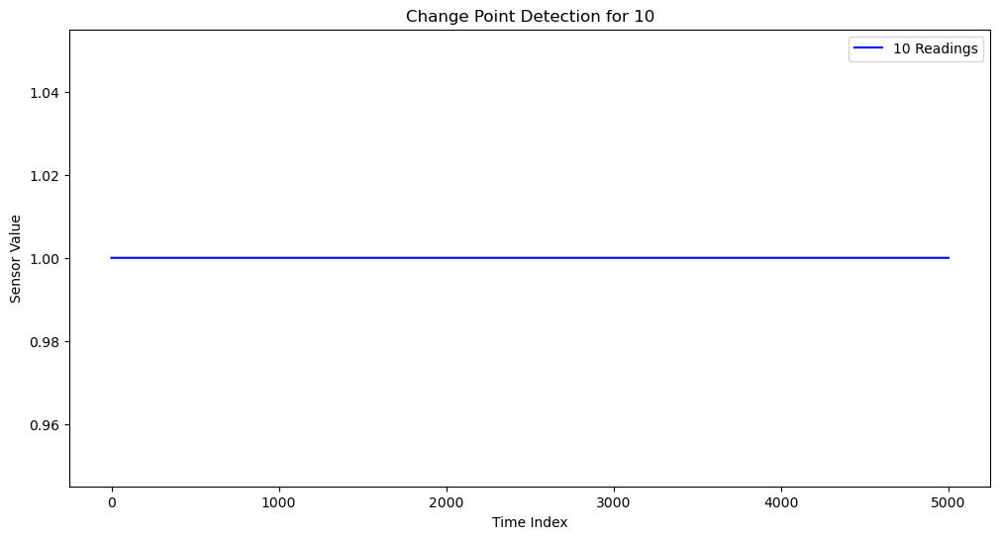

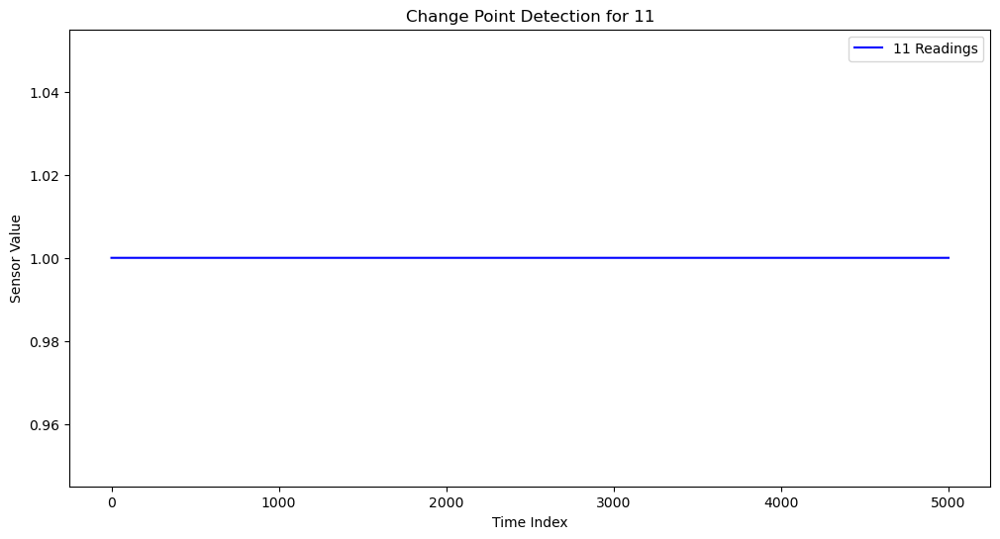

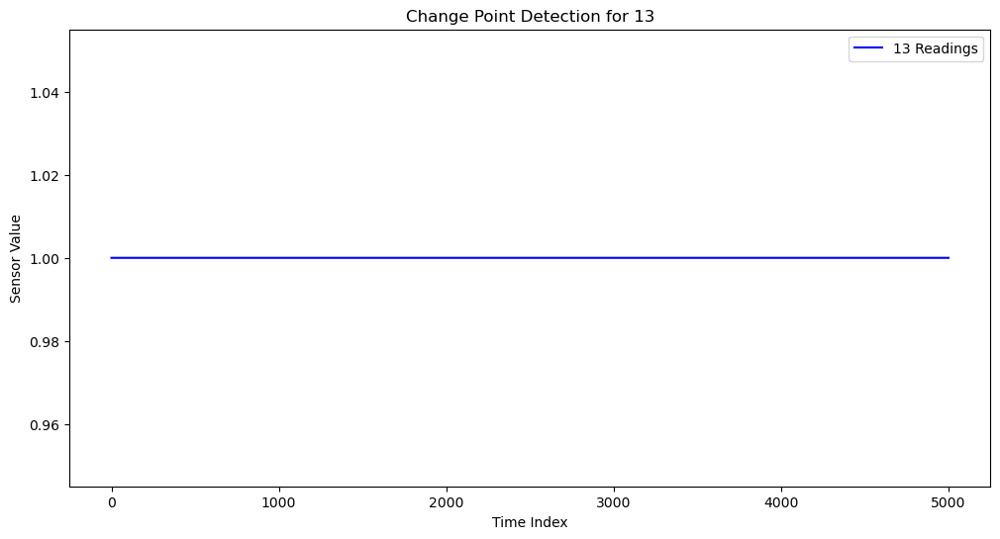

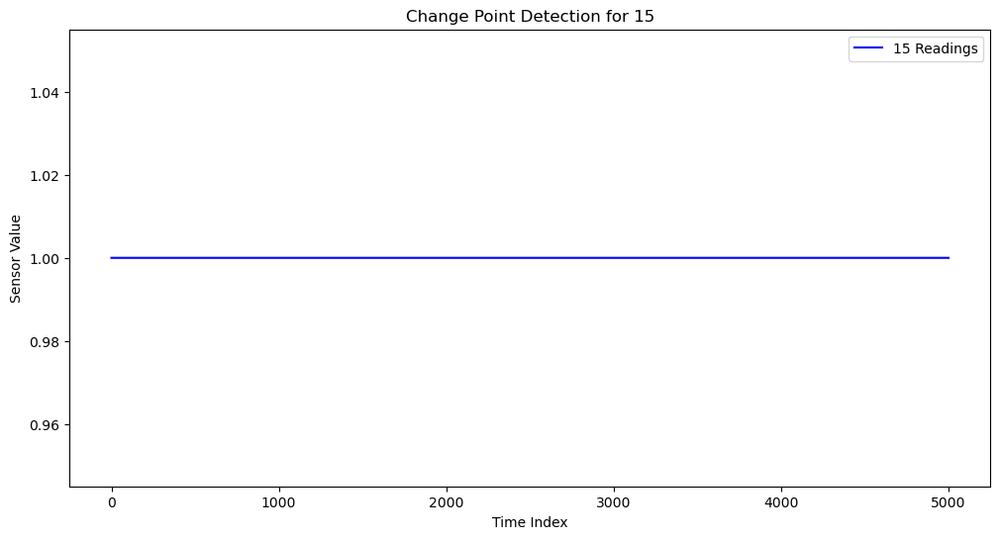

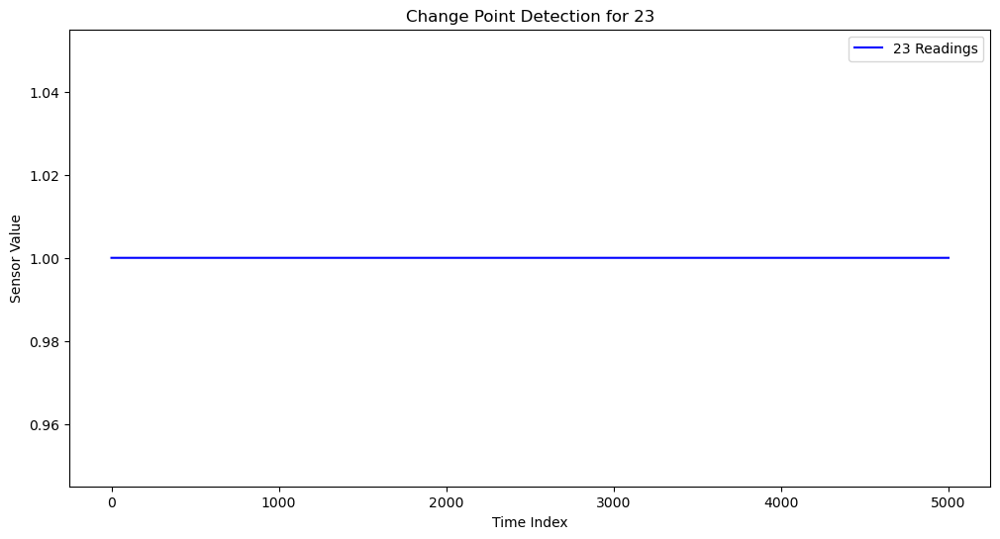

...

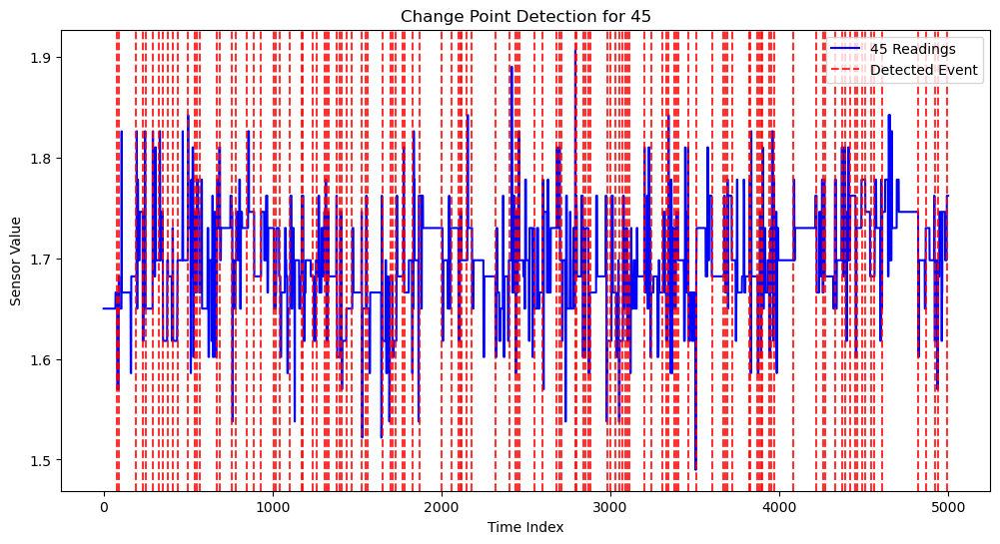

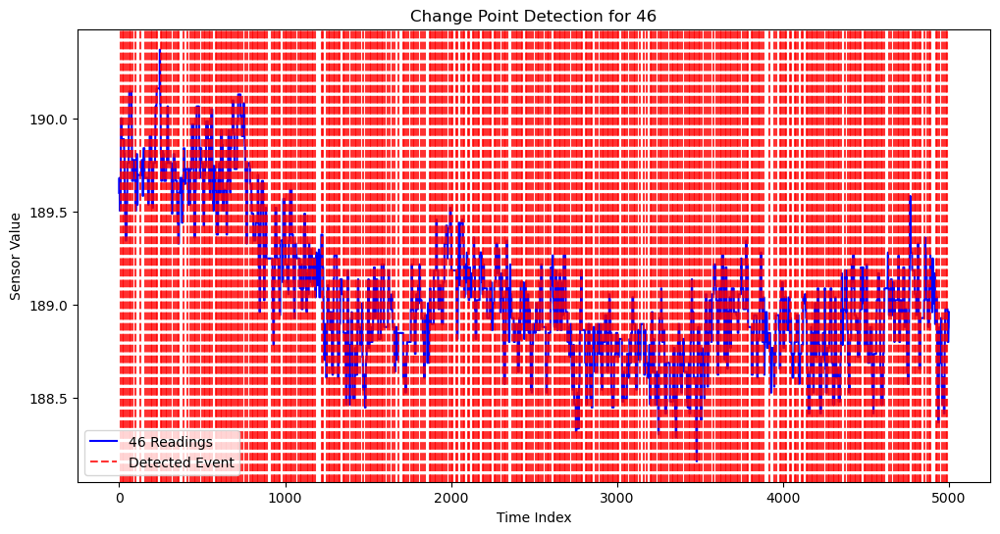

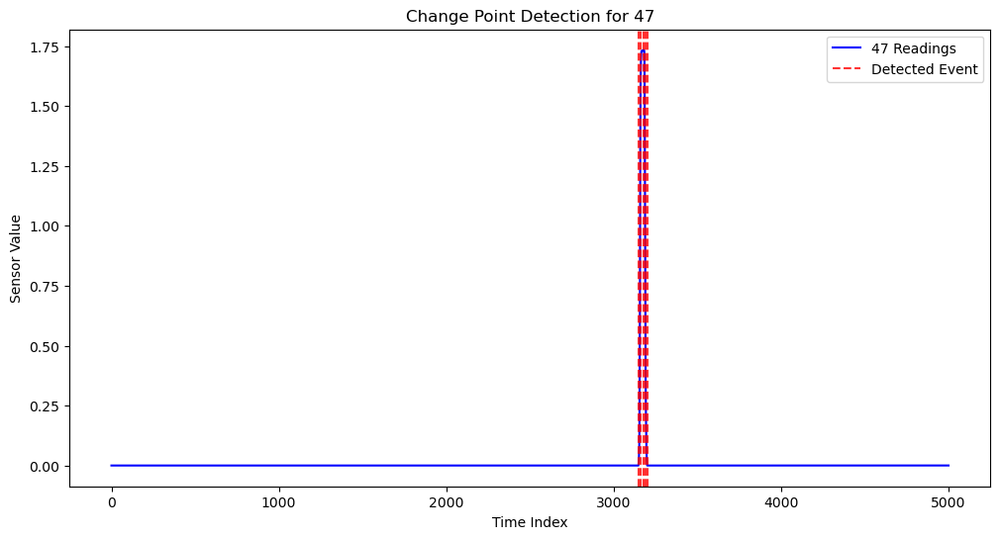

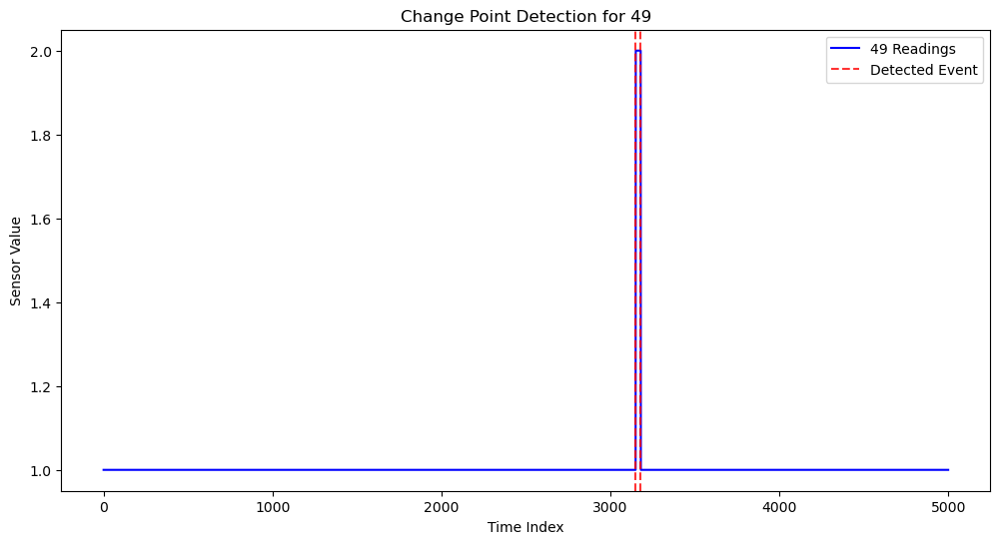

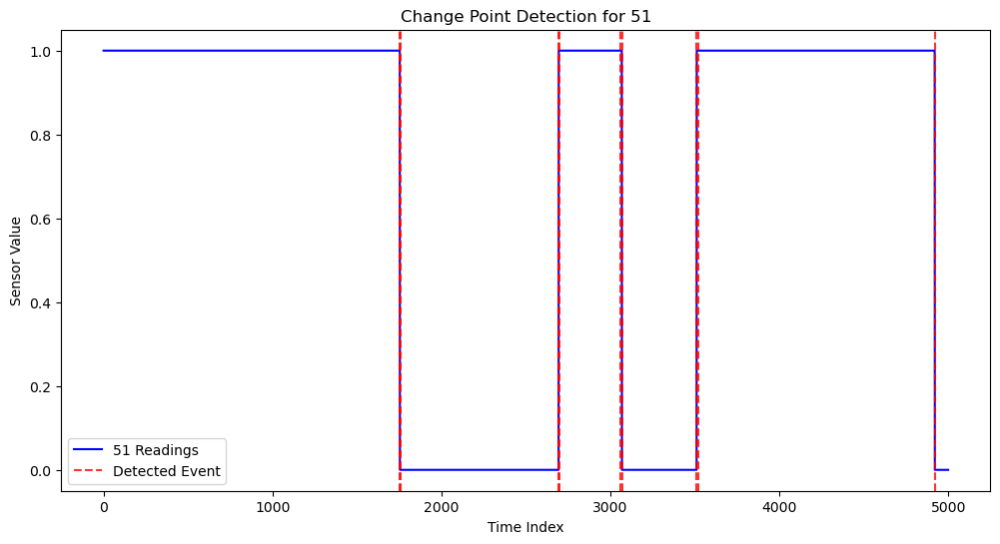

In [84]:
import matplotlib.pyplot as plt

def plot_each_sensor_separately(df, event_dict_0_01):
    """
    Plots detected changepoints for each sensor in separate figures.
    """
    for sensor_name in event_dict_0_01:
        sensor_data = df[sensor_name].values
        changepoints = event_dict_0_01[sensor_name]

        plt.figure(figsize=(12, 6))
        plt.plot(sensor_data, label=f"{sensor_name} Readings", color="blue")

        # Mark detected changepoints
        for cp in changepoints:
            plt.axvline(cp, color="red", linestyle="dashed", alpha=0.8, label="Detected Event" if cp == changepoints[0] else "")

        plt.title(f"Change Point Detection for {sensor_name}")
        plt.xlabel("Time Index")
        plt.ylabel("Sensor Value")
        plt.legend()
        plt.show()

# Call the function to generate separate plots for each sensor
plot_each_sensor_separately(df, event_dict_0_01)


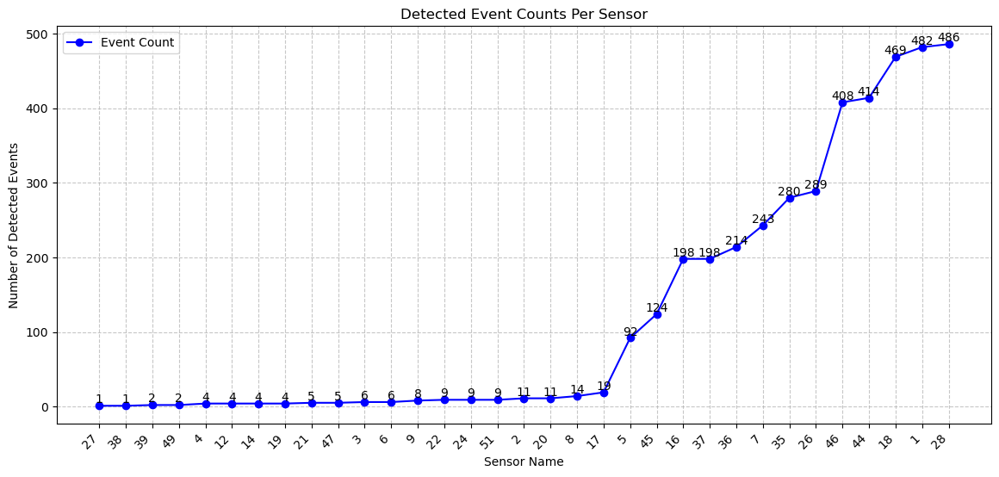

In [21]:
import matplotlib.pyplot as plt
def plot_event_line_graph(event_dict_0_01):
    # Filter out sensors with no detected events
    event_counts = {sensor: len(changepoints) for sensor, changepoints in event_dict_0_01.items() if len(changepoints) > 0}
    if not event_counts:
        print("No sensors with detected events.")
        return
    # Sort sensors by event count for better visualization
    sorted_sensors = sorted(event_counts, key=event_counts.get)
    sorted_counts = [event_counts[sensor] for sensor in sorted_sensors]
    # Plot the line graph
    plt.figure(figsize=(14, 6))
    plt.plot(sorted_sensors, sorted_counts, marker='o', linestyle='-', color='b', markersize=6, label="Event Count")
    # Highlight each point
    for i, count in enumerate(sorted_counts):
        plt.text(i, count, str(count), ha='center', va='bottom', fontsize=10, color='black')
    # Formatting
    plt.xlabel("Sensor Name")
    plt.ylabel("Number of Detected Events")
    plt.title("Detected Event Counts Per Sensor")
    plt.xticks(rotation=45, ha="right")  # Rotate labels for better readability
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.show()
# Call the function to generate the line graph
plot_event_line_graph(event_dict_0_01)


In [23]:
#PELT 0.001
import numpy as np
import pandas as pd
import ruptures as rpt
import time

In [25]:
# Load SWaT dataset
df = pd.read_csv("C:/Users/gutti/OneDrive/Documents/Project/Subsequences/subsequence_1.csv")  # Update with actual file path
sensor_columns = df.columns[1:]  # Ignore timestamp column

# Convert dataset to NumPy array
data = df[sensor_columns].values

# Set penalty for changepoint detection
penalty_value = 0.001  # Adjust as needed

# Dictionary to store detected changepoints for each sensor
event_dict_0_001 = {}

start_time = time.time()  # Track execution time


In [27]:
# Apply PELT on each column
for i, col in enumerate(sensor_columns):
    sensor_data = data[:, i]
    
    # Skip columns with constant values (no changes)
    if np.all(sensor_data == sensor_data[0]):
        event_dict_0_001[col] = []
        continue

    # Apply PELT
    algo = rpt.Pelt(model="l2", min_size=10, jump=10).fit(sensor_data)
    changepoints = algo.predict(pen=penalty_value)
    
    # Store detected changepoints (excluding last index)
    event_dict_0_001[col] = changepoints[:-1]

    # Print progress
    print(f"Processed {col} - {len(changepoints)-1} events detected")

Processed 1 - 487 events detected
Processed 2 - 11 events detected
Processed 3 - 6 events detected
Processed 4 - 4 events detected
Processed 5 - 116 events detected
Processed 6 - 18 events detected
Processed 7 - 317 events detected
Processed 8 - 19 events detected
Processed 9 - 8 events detected
Processed 12 - 4 events detected
Processed 14 - 4 events detected
Processed 16 - 366 events detected
Processed 17 - 26 events detected
Processed 18 - 490 events detected
Processed 19 - 4 events detected
Processed 20 - 11 events detected
Processed 21 - 5 events detected
Processed 22 - 9 events detected
Processed 24 - 9 events detected
Processed 26 - 353 events detected
Processed 27 - 4 events detected
Processed 28 - 494 events detected
Processed 34 - 4 events detected
Processed 35 - 362 events detected
Processed 36 - 263 events detected
Processed 37 - 264 events detected
Processed 38 - 4 events detected
Processed 39 - 122 events detected
Processed 40 - 0 events detected
Processed 41 - 0 events d

In [29]:
end_time = time.time()  # Stop tracking execution time
print(f"\nTotal execution time: {end_time - start_time:.2f} seconds\n")

# Display results
for col, changepoints in event_dict_0_001.items():
    print(f"{col}: {changepoints}")


Total execution time: 256.53 seconds

1: [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510, 520, 530, 540, 550, 560, 570, 580, 590, 600, 610, 620, 630, 640, 650, 660, 670, 680, 690, 700, 710, 720, 730, 740, 750, 760, 770, 780, 790, 800, 810, 820, 830, 840, 850, 860, 870, 880, 890, 900, 910, 920, 930, 940, 950, 960, 970, 980, 990, 1000, 1010, 1020, 1030, 1040, 1050, 1060, 1070, 1080, 1090, 1100, 1110, 1120, 1130, 1140, 1150, 1160, 1170, 1180, 1190, 1200, 1210, 1220, 1230, 1240, 1250, 1260, 1270, 1280, 1290, 1300, 1310, 1320, 1330, 1340, 1350, 1360, 1370, 1380, 1390, 1400, 1420, 1440, 1450, 1460, 1470, 1480, 1490, 1500, 1510, 1530, 1540, 1550, 1560, 1570, 1580, 1590, 1600, 1610, 1620, 1630, 1640, 1650, 1660, 1670, 1680, 1690, 1700, 1710, 1720, 1730, 1740, 1750, 1760, 1770, 1780, 1790, 1800, 181

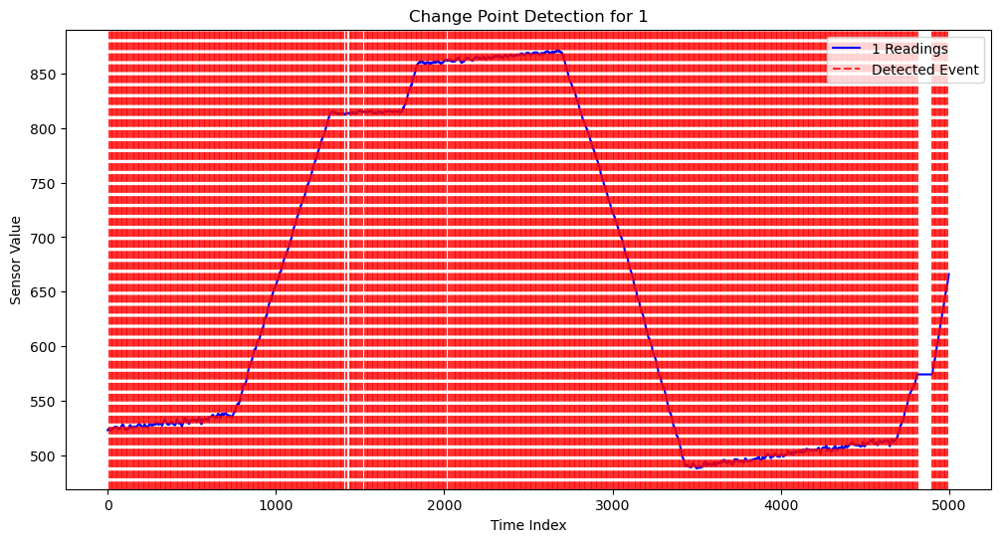

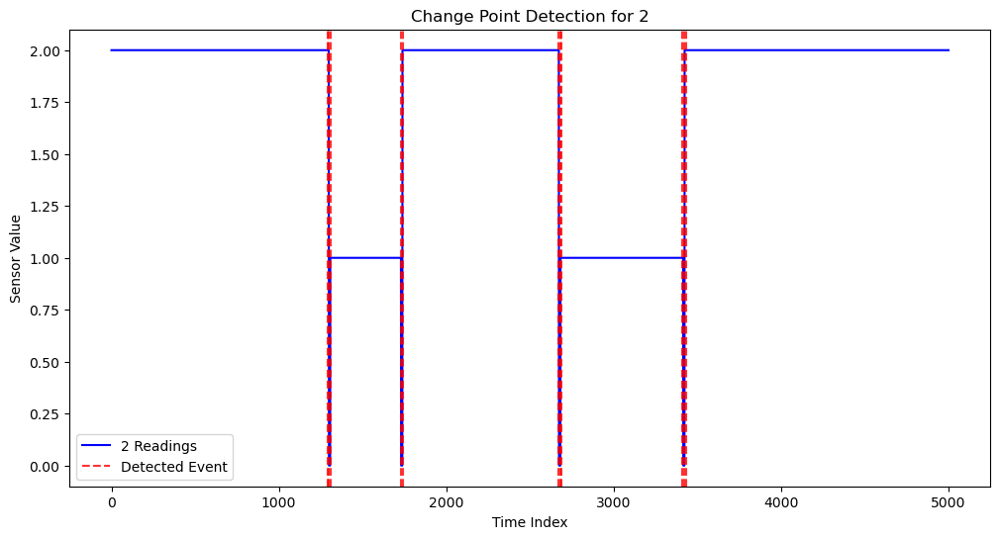

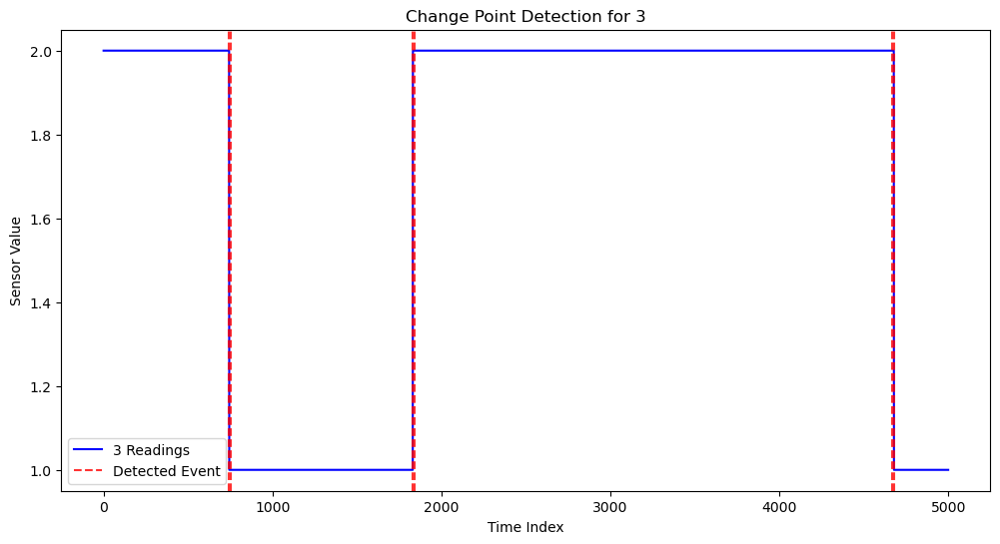

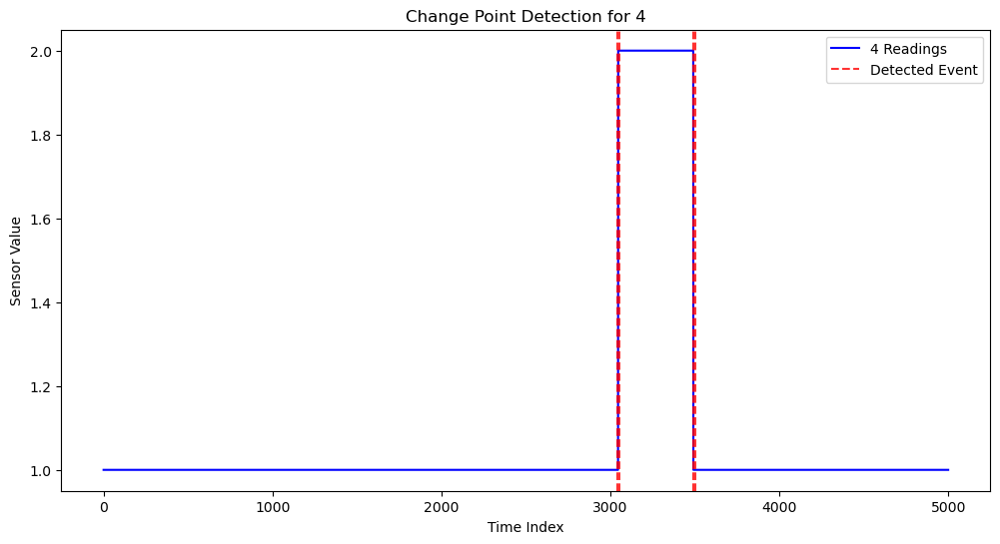

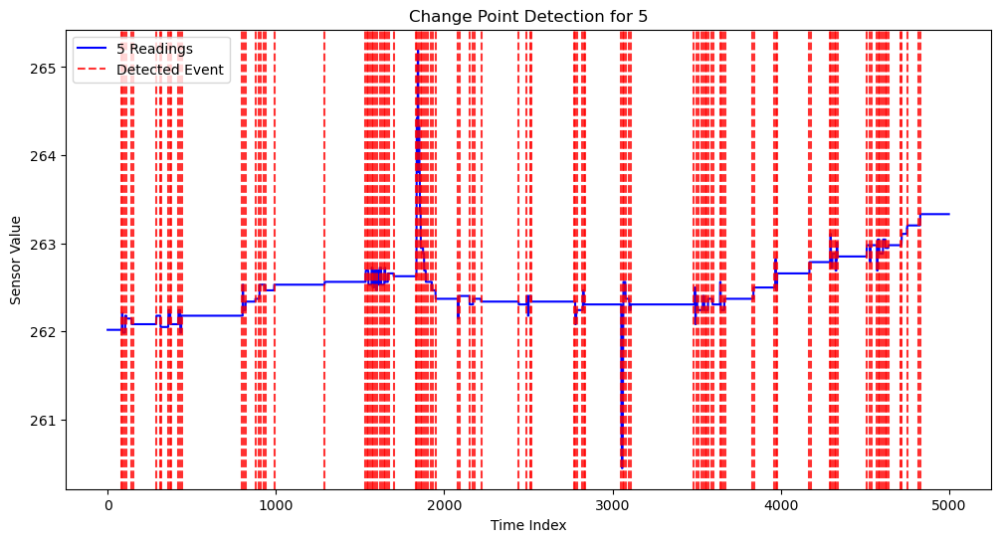

...

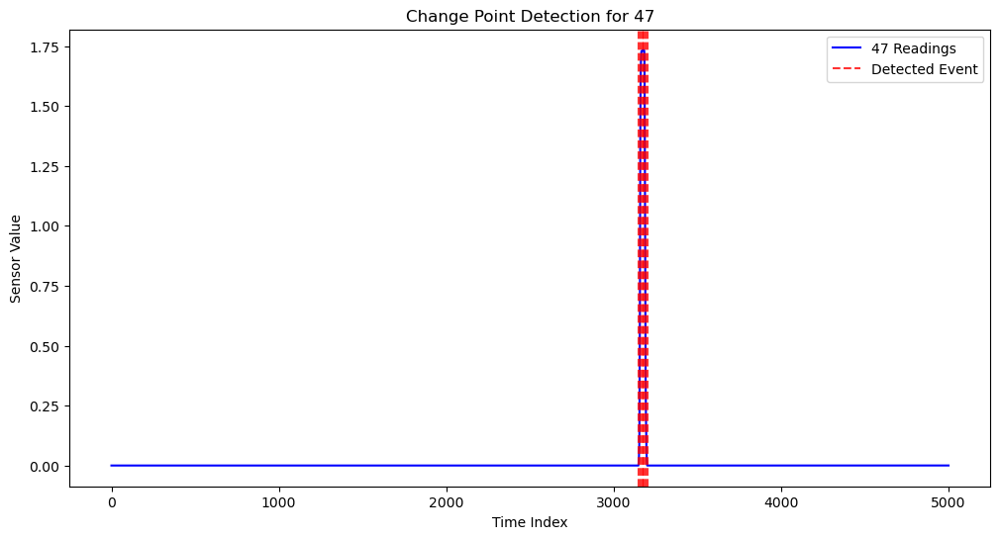

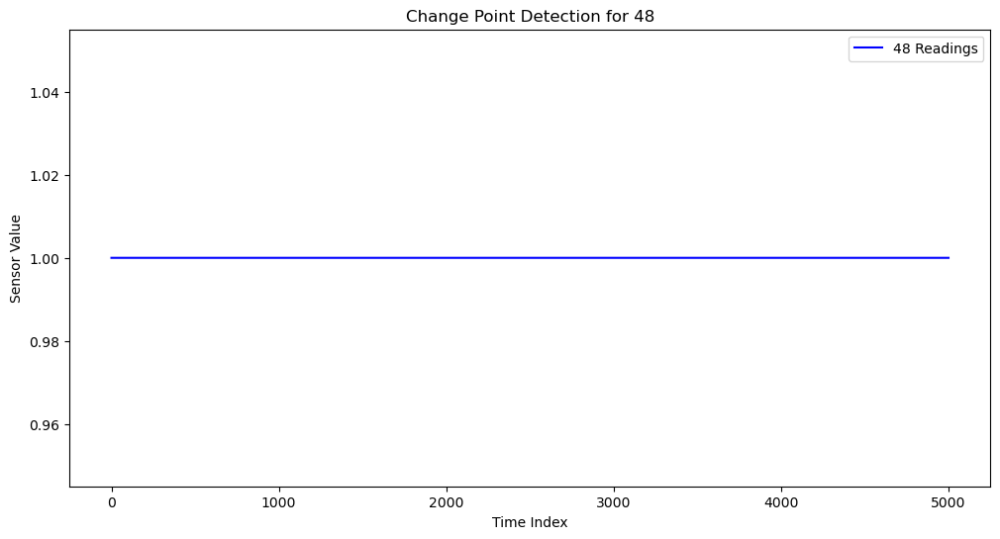

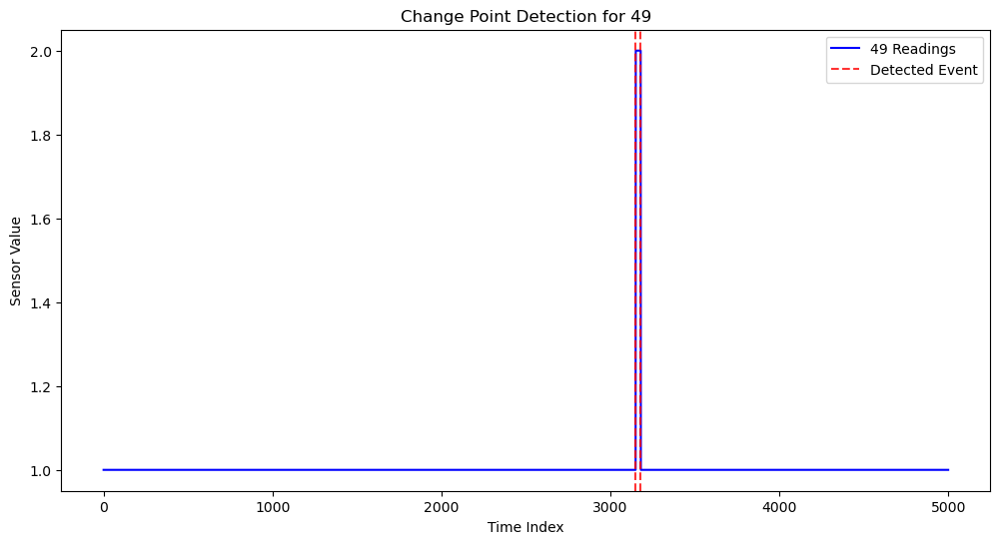

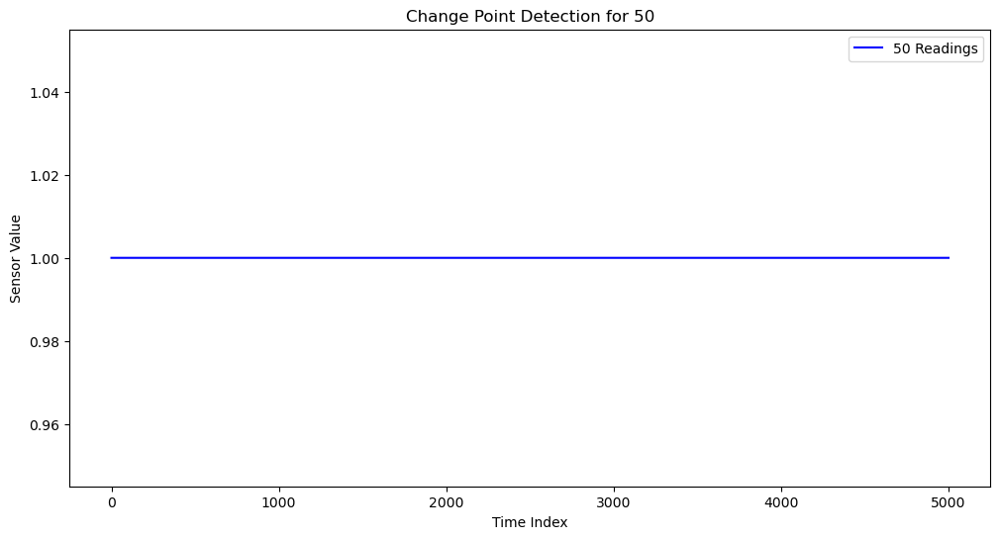

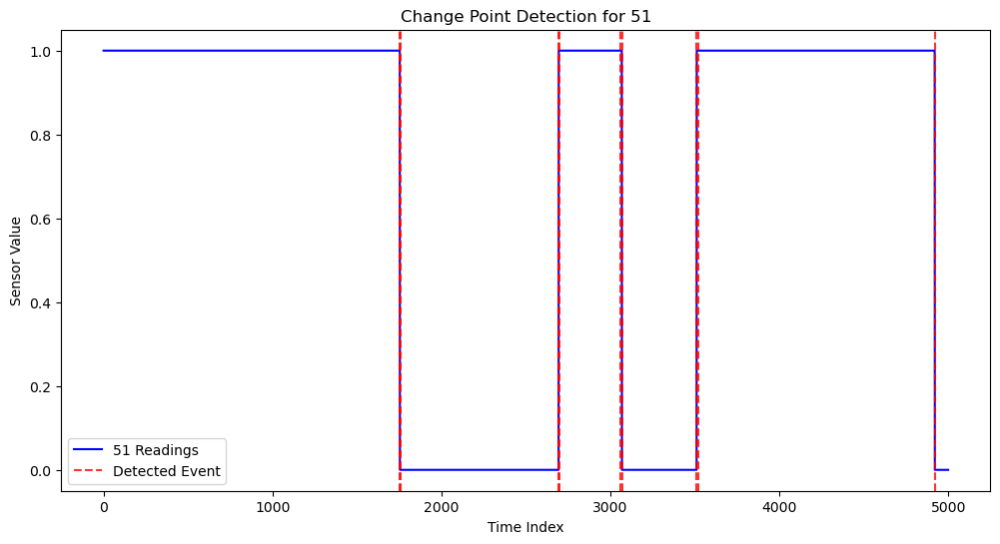

In [98]:
import matplotlib.pyplot as plt

def plot_each_sensor_separately(df, event_dict_0_001):
    """
    Plots detected changepoints for each sensor in separate figures.
    """
    for sensor_name in event_dict_0_001:
        sensor_data = df[sensor_name].values
        changepoints = event_dict_0_001[sensor_name]

        plt.figure(figsize=(12, 6))
        plt.plot(sensor_data, label=f"{sensor_name} Readings", color="blue")

        # Mark detected changepoints
        for cp in changepoints:
            plt.axvline(cp, color="red", linestyle="dashed", alpha=0.8, label="Detected Event" if cp == changepoints[0] else "")

        plt.title(f"Change Point Detection for {sensor_name}")
        plt.xlabel("Time Index")
        plt.ylabel("Sensor Value")
        plt.legend()
        plt.show()

# Call the function to generate separate plots for each sensor
plot_each_sensor_separately(df, event_dict_0_001)


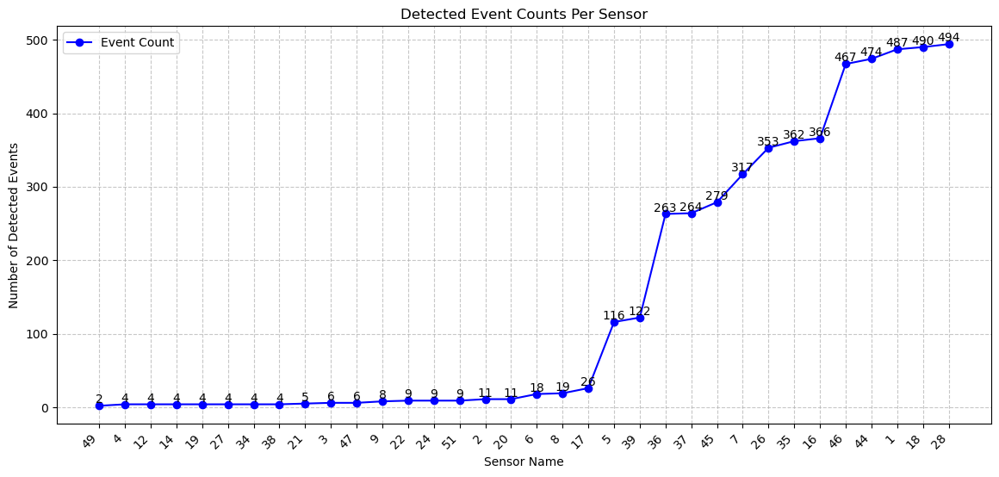

In [43]:
import matplotlib.pyplot as plt
def plot_event_line_graph(event_dict_0_001):
    # Filter out sensors with no detected events
    event_counts = {sensor: len(changepoints) for sensor, changepoints in event_dict_0_001.items() if len(changepoints) > 0}
    if not event_counts:
        print("No sensors with detected events.")
        return
    # Sort sensors by event count for better visualization
    sorted_sensors = sorted(event_counts, key=event_counts.get)
    sorted_counts = [event_counts[sensor] for sensor in sorted_sensors]
    # Plot the line graph
    plt.figure(figsize=(14, 6))
    plt.plot(sorted_sensors, sorted_counts, marker='o', linestyle='-', color='b', markersize=6, label="Event Count")
    # Highlight each point
    for i, count in enumerate(sorted_counts):
        plt.text(i, count, str(count), ha='center', va='bottom', fontsize=10, color='black')
    # Formatting
    plt.xlabel("Sensor Name")
    plt.ylabel("Number of Detected Events")
    plt.title("Detected Event Counts Per Sensor")
    plt.xticks(rotation=45, ha="right")  # Rotate labels for better readability
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.show()
# Call the function to generate the line graph
plot_event_line_graph(event_dict_0_001)


In [35]:
#PELT 1
import numpy as np
import pandas as pd
import ruptures as rpt
import time

In [37]:
# Load SWaT dataset
df = pd.read_csv("C:/Users/gutti/OneDrive/Documents/Project/Subsequences/subsequence_1.csv")  # Update with actual file path
sensor_columns = df.columns[1:]  # Ignore timestamp column

# Convert dataset to NumPy array
data = df[sensor_columns].values

# Set penalty for changepoint detection
penalty_value = 1  # Adjust as needed

# Dictionary to store detected changepoints for each sensor
event_dict_1 = {}

start_time = time.time()  # Track execution time


In [39]:
# Apply PELT on each column
for i, col in enumerate(sensor_columns):
    sensor_data = data[:, i]
    
    # Skip columns with constant values (no changes)
    if np.all(sensor_data == sensor_data[0]):
       event_dict_1[col] = []
       continue

    # Apply PELT
    algo = rpt.Pelt(model="l2", min_size=10, jump=10).fit(sensor_data)
    changepoints = algo.predict(pen=penalty_value)
    
    # Store detected changepoints (excluding last index)
    event_dict_1[col] = changepoints[:-1]

    # Print progress
    print(f"Processed {col} - {len(changepoints)-1} events detected")

Processed 1 - 383 events detected
Processed 2 - 9 events detected
Processed 3 - 4 events detected
Processed 4 - 3 events detected
Processed 5 - 19 events detected
Processed 6 - 2 events detected
Processed 7 - 65 events detected
Processed 8 - 8 events detected
Processed 9 - 5 events detected
Processed 12 - 4 events detected
Processed 14 - 4 events detected
Processed 16 - 23 events detected
Processed 17 - 9 events detected
Processed 18 - 326 events detected
Processed 19 - 4 events detected
Processed 20 - 8 events detected
Processed 21 - 3 events detected
Processed 22 - 7 events detected
Processed 24 - 6 events detected
Processed 26 - 26 events detected
Processed 27 - 0 events detected
Processed 28 - 389 events detected
Processed 34 - 0 events detected
Processed 35 - 46 events detected
Processed 36 - 43 events detected
Processed 37 - 4 events detected
Processed 38 - 0 events detected
Processed 39 - 0 events detected
Processed 40 - 0 events detected
Processed 41 - 0 events detected
Process

In [41]:
end_time = time.time()  # Stop tracking execution time
print(f"\nTotal execution time: {end_time - start_time:.2f} seconds\n")

# Display results
for col, changepoints in event_dict_1.items():
    print(f"{col}: {changepoints}")


Total execution time: 354.16 seconds

1: [30, 40, 60, 80, 100, 120, 130, 140, 150, 170, 180, 190, 200, 210, 230, 240, 250, 270, 290, 300, 310, 320, 330, 350, 370, 380, 390, 400, 410, 420, 430, 440, 450, 470, 480, 490, 520, 540, 550, 560, 580, 590, 600, 610, 620, 630, 650, 670, 680, 690, 710, 720, 730, 740, 750, 760, 770, 780, 790, 800, 810, 820, 830, 840, 850, 860, 870, 880, 890, 900, 910, 920, 930, 940, 950, 960, 970, 980, 990, 1000, 1010, 1020, 1030, 1040, 1050, 1060, 1070, 1080, 1090, 1100, 1110, 1120, 1130, 1140, 1150, 1160, 1170, 1180, 1190, 1200, 1210, 1220, 1230, 1240, 1250, 1260, 1270, 1280, 1290, 1300, 1310, 1320, 1330, 1350, 1360, 1400, 1420, 1450, 1480, 1490, 1510, 1530, 1550, 1570, 1580, 1600, 1610, 1620, 1650, 1730, 1750, 1760, 1770, 1780, 1790, 1800, 1810, 1820, 1830, 1840, 1850, 1870, 1880, 1890, 1910, 1930, 1950, 1970, 1990, 2000, 2040, 2070, 2080, 2090, 2100, 2110, 2120, 2130, 2150, 2160, 2170, 2180, 2210, 2220, 2230, 2240, 2250, 2290, 2300, 2340, 2350, 2360, 2370, 23

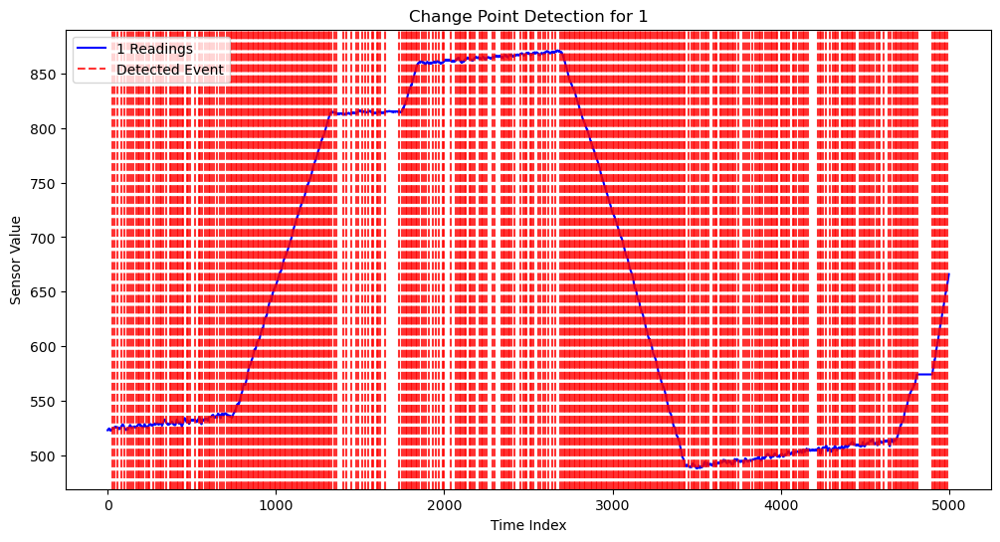

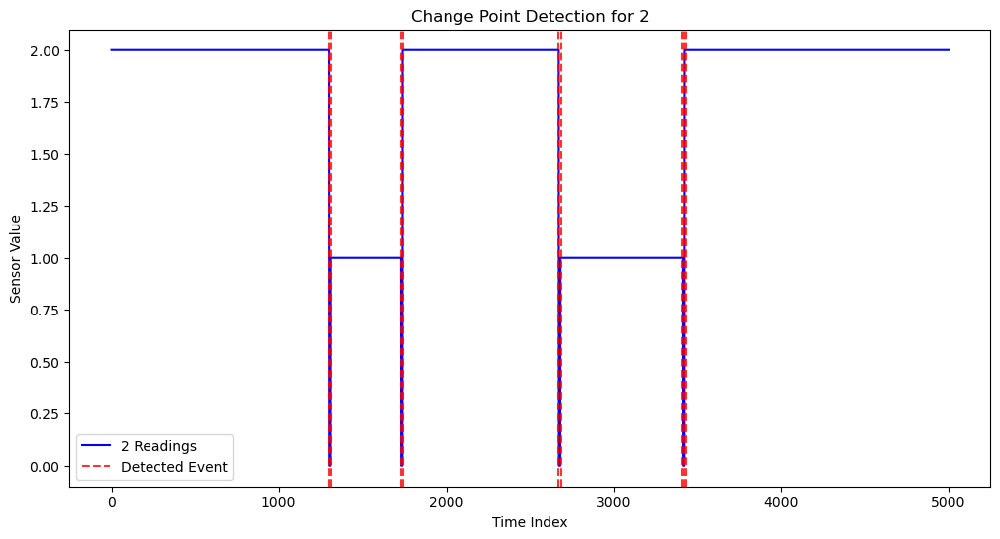

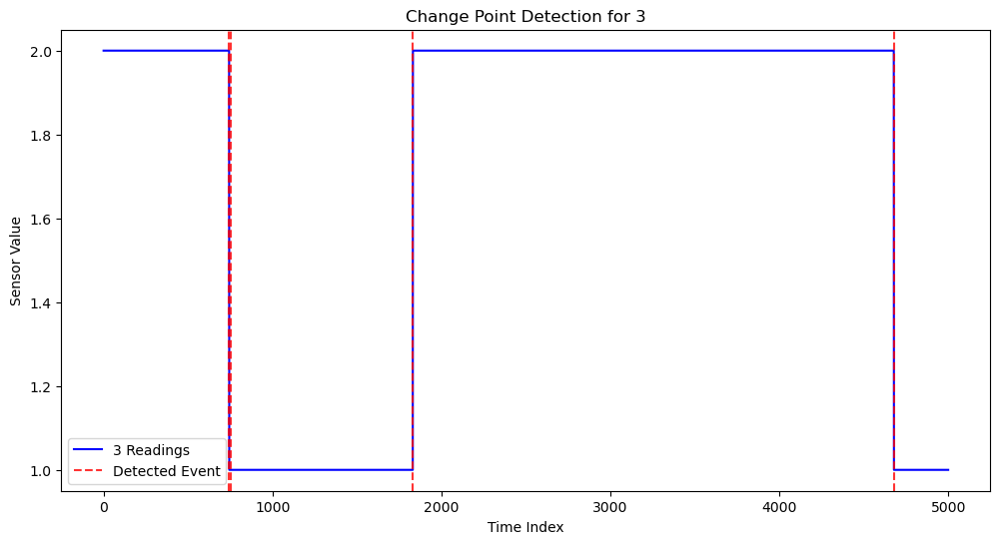

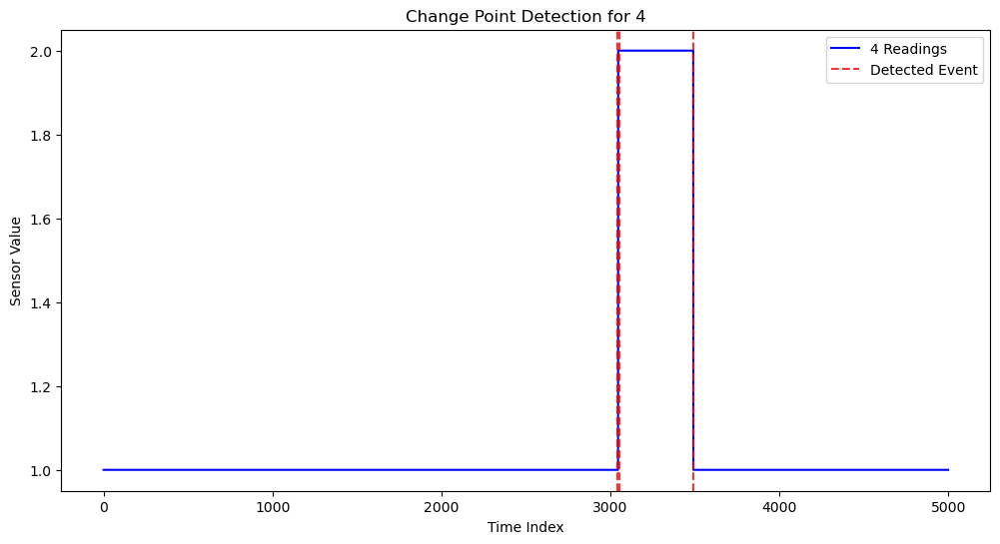

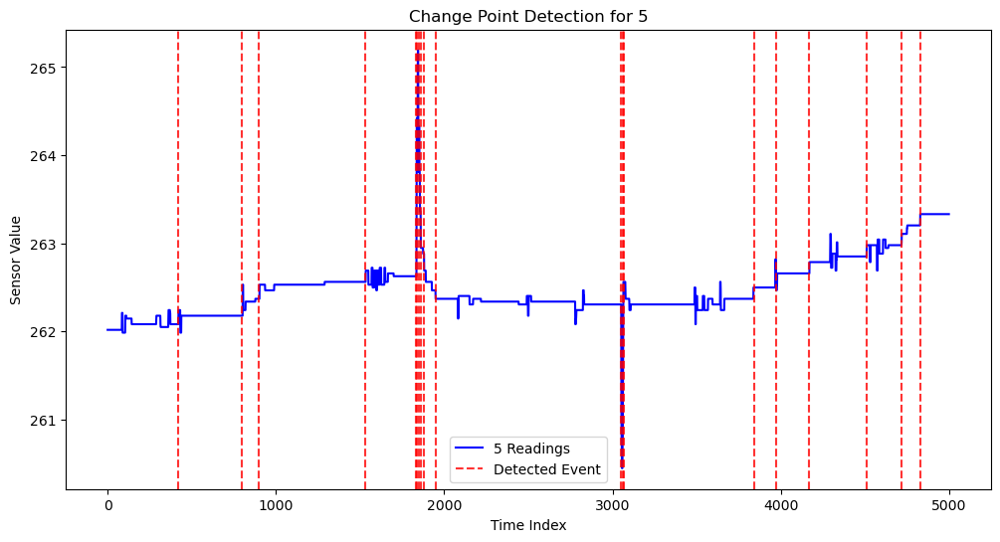

...

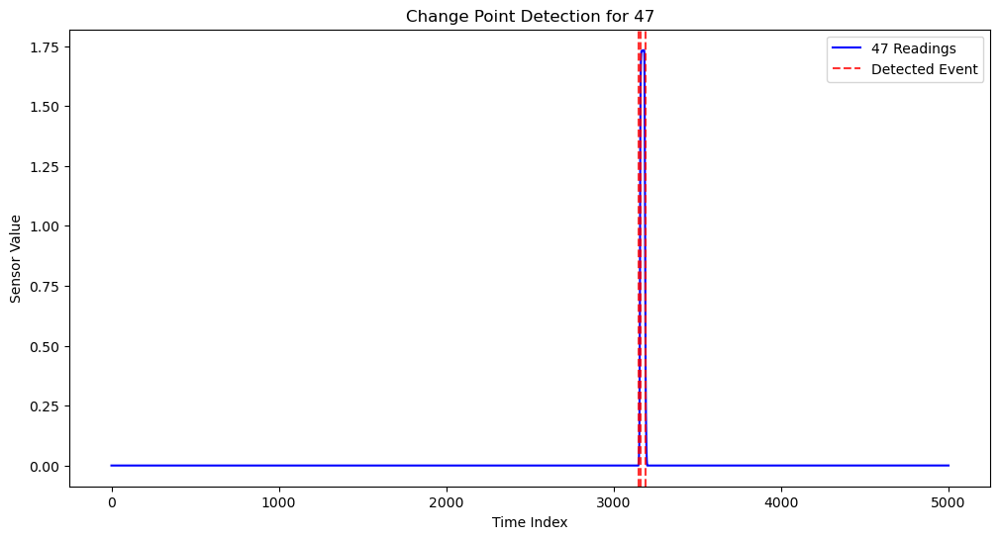

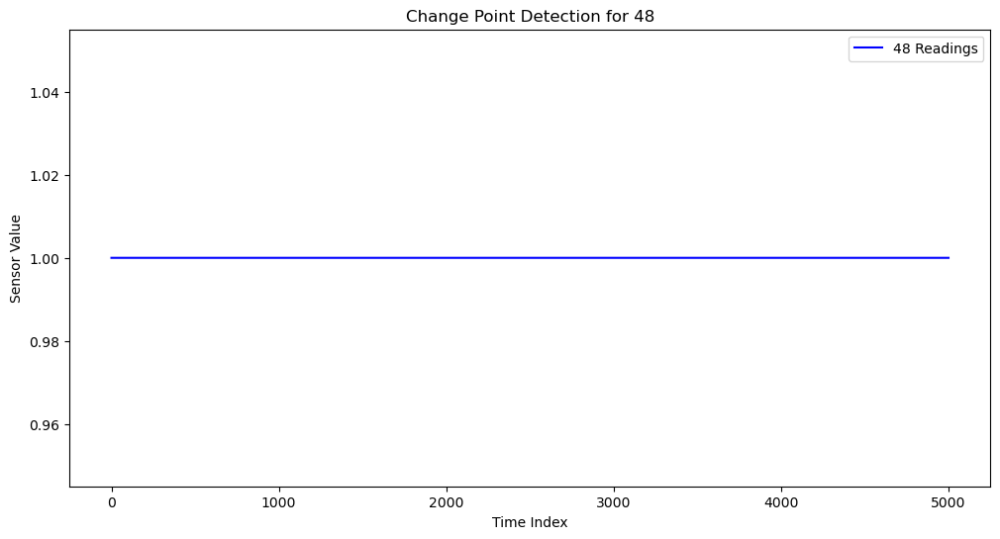

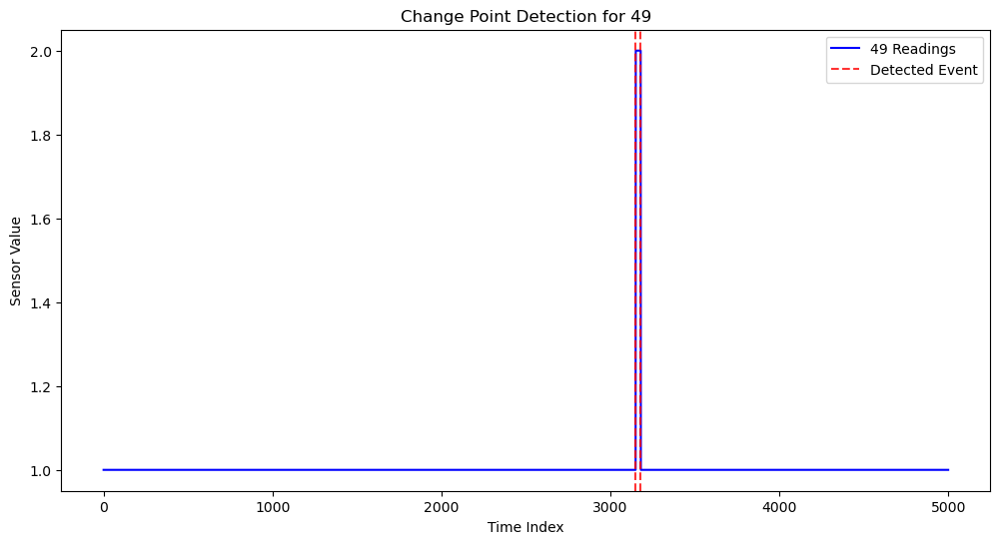

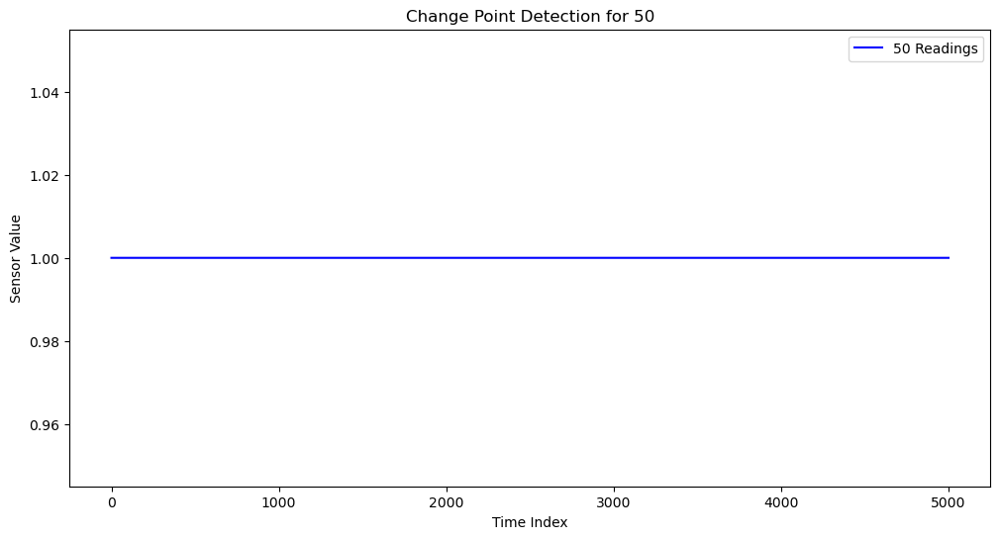

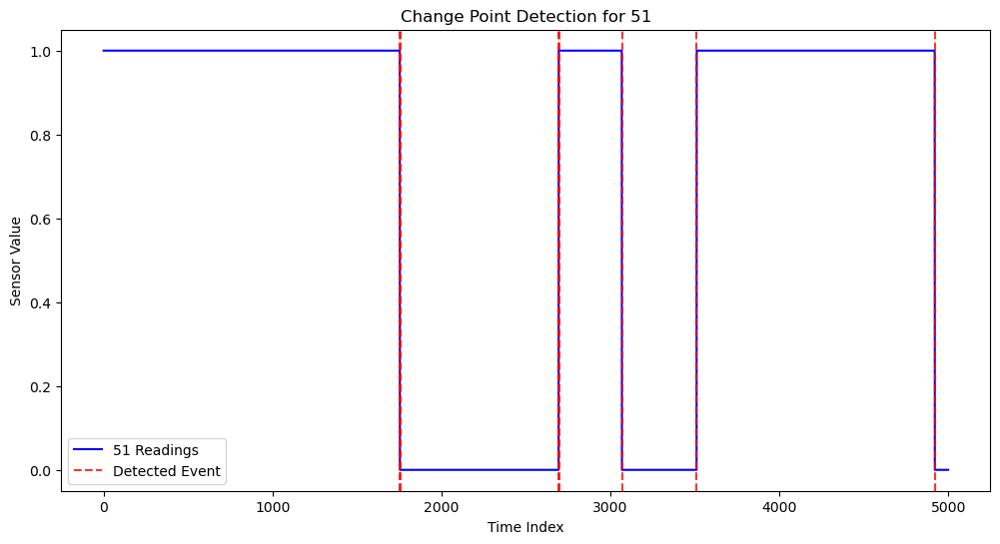

In [112]:
import matplotlib.pyplot as plt

def plot_each_sensor_separately(df, event_dict_1):
    """
    Plots detected changepoints for each sensor in separate figures.
    """
    for sensor_name in event_dict_1:
        sensor_data = df[sensor_name].values
        changepoints = event_dict_1[sensor_name]

        plt.figure(figsize=(12, 6))
        plt.plot(sensor_data, label=f"{sensor_name} Readings", color="blue")

        # Mark detected changepoints
        for cp in changepoints:
            plt.axvline(cp, color="red", linestyle="dashed", alpha=0.8, label="Detected Event" if cp == changepoints[0] else "")

        plt.title(f"Change Point Detection for {sensor_name}")
        plt.xlabel("Time Index")
        plt.ylabel("Sensor Value")
        plt.legend()
        plt.show()

# Call the function to generate separate plots for each sensor
plot_each_sensor_separately(df, event_dict_1)


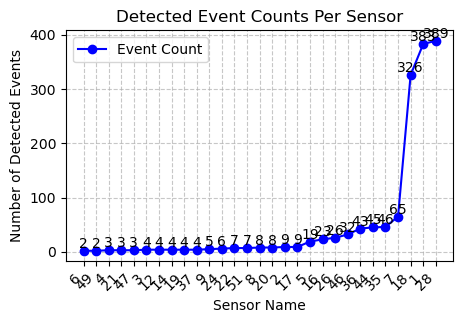

In [45]:
import matplotlib.pyplot as plt
def plot_event_line_graph(event_dict_1):
        # Filter out sensors with no detected events
    event_counts = {sensor: len(changepoints) for sensor, changepoints in event_dict_1.items() if len(changepoints) > 0}
    if not event_counts:
        print("No sensors with detected events.")
        return
    # Sort sensors by event count for better visualization
    sorted_sensors = sorted(event_counts, key=event_counts.get)
    sorted_counts = [event_counts[sensor] for sensor in sorted_sensors]
    # Plot the line graph
    plt.figure(figsize=(5, 3))
    plt.plot(sorted_sensors, sorted_counts, marker='o', linestyle='-', color='b', markersize=6, label="Event Count")

    # Highlight each point
    for i, count in enumerate(sorted_counts):
        plt.text(i, count, str(count), ha='center', va='bottom', fontsize=10, color='black')
    # Formatting
    plt.xlabel("Sensor Name")
    plt.ylabel("Number of Detected Events")
    plt.title("Detected Event Counts Per Sensor")
    plt.xticks(rotation=45, ha="right")  # Rotate labels for better readability
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.show()
# Call the function to generate the line graph
plot_event_line_graph(event_dict_1)


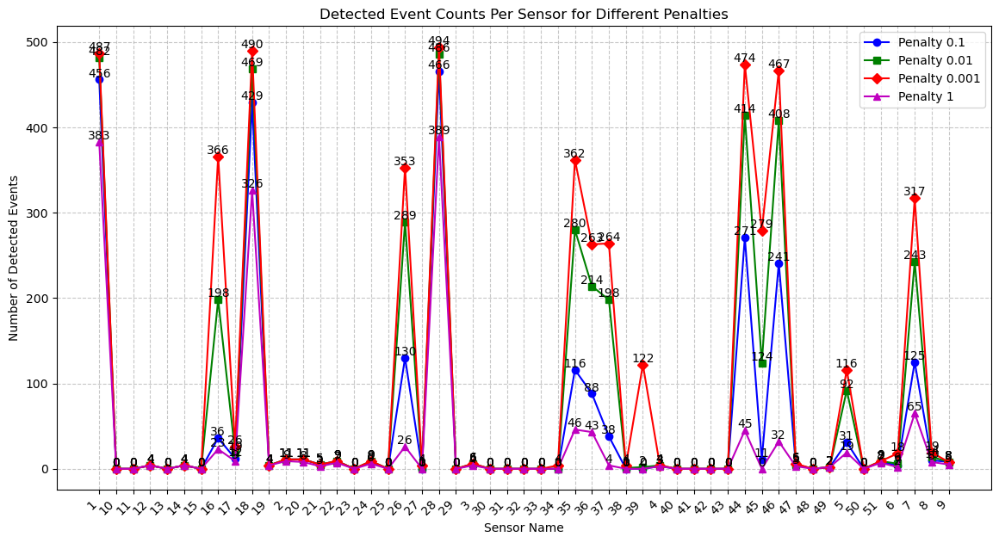

In [47]:
import matplotlib.pyplot as plt
def plot_combined_event_line_graph(event_dicts, thresholds):
    plt.figure(figsize=(14, 7))
    colors = ['b', 'g', 'r', 'm']  # Colors for different penalties
    markers = ['o', 's', 'D', '^']  # Different markers for distinction
    # Get all sensors that have at least one detected event in any penalty
    all_sensors = set()
    for event_dict in event_dicts:
        all_sensors.update(event_dict.keys())
    all_sensors = sorted(all_sensors)  # Sort for better visualization
    x_positions = range(len(all_sensors))  # X-axis positions for sensor names
    for i, (event_dict, threshold) in enumerate(zip(event_dicts, thresholds)):
        event_counts = [len(event_dict.get(sensor, [])) for sensor in all_sensors]

        plt.plot(x_positions, event_counts, marker=markers[i], linestyle='-', 
                 color=colors[i], markersize=6, label=f"Penalty {threshold}")
        for j, count in enumerate(event_counts):
            plt.text(x_positions[j], count, str(count), ha='center', va='bottom', fontsize=10, color='black')
    plt.xlabel("Sensor Name")
    plt.ylabel("Number of Detected Events")
    plt.title("Detected Event Counts Per Sensor for Different Penalties")
    plt.xticks(x_positions, all_sensors, rotation=45, ha="right")  # Rotate labels for clarity
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.show()
# Example usage:
thresholds = [0.1, 0.01, 0.001, 1]  # Penalty values
event_dicts = [event_dict_0_1, event_dict_0_01, event_dict_0_001, event_dict_1]  # Replace with actual event dicts
plot_combined_event_line_graph(event_dicts, thresholds)


In [49]:
import numpy as np
import pandas as pd
from scipy.stats import mode

def determine_target_length(segments):
    """
    Determines the system-dependent target length for sampling based on event distribution.
    
    :param segments: List of segmented event sequences.
    :return: Optimal target length.
    """
    lengths = [len(seg) for seg in segments if len(seg) > 0]

    if not lengths:
        return 100  # Default fallback if no valid segments

    mode_result = mode(lengths, keepdims=True)  # Ensure output is always an array
    target_length = int(mode_result.mode[0]) if mode_result.count[0] > 1 else int(np.median(lengths))  # Use median if mode fails

    print(f"✅ System-dependent target length determined: {target_length}")
    return target_length

def sampler(event_segments, target_length):
    """
    Converts event segments of different lengths into fixed-length vectors.
    
    :param event_segments: List of NumPy arrays (each event segment).
    :param target_length: The fixed length to which each segment is resampled.
    :return: List of resampled event segments.
    """
    resampled_segments = []

    for segment in event_segments:
        original_length = len(segment)

        if original_length == 0:
            resampled_segments.append(np.zeros(target_length))  # Handle empty segments
            continue

        ratio = original_length / target_length

        if ratio > 1.0:  # Down-Sampling
            downsampled = []
            for i in range(target_length):
                start_idx = int(i * ratio)
                end_idx = min(int((i + 1) * ratio), original_length)
                avg_value = np.mean(segment[start_idx:end_idx])  # Mean of the range
                max_min_diff = (np.max(segment[start_idx:end_idx]) - np.min(segment[start_idx:end_idx])) / 2
                downsampled.append(avg_value + max_min_diff)
            resampled_segments.append(np.array(downsampled))

        else:  # Up-Sampling
            upsampled = np.interp(np.linspace(0, original_length-1, target_length),
                                  np.arange(original_length), segment)
            resampled_segments.append(upsampled)

    return resampled_segments

def segment_events(df, event_dict):
    segmented_events = []
    for sensor in event_dict:  
        changepoints = event_dict[sensor]
        changepoints = [0] + changepoints + [len(df)]  # Add start & end indexes
        segments = [df[sensor].iloc[changepoints[j]:changepoints[j+1]].values for j in range(len(changepoints) - 1)]
        segmented_events.extend(segments)  # Collect all event segments

    return segmented_events
# Example data (Replace with actual event detections)
penalties = [0.1, 0.01, 0.001, 1]
event_dicts = [event_dict_0_1, event_dict_0_01, event_dict_0_001, event_dict_1]  # Replace with actual detected event dicts
resampled_data = {}
# Process all four penalty values separately
for i, penalty in enumerate(penalties):
    print(f"\n🔹 Processing Sampler for Penalty {penalty}...")

    # Segment events for each penalty
    segmented_events = segment_events(df, event_dicts[i])

    # Determine system-dependent target length
    target_length = determine_target_length(segmented_events)

    # Apply sampler
    resampled_data[penalty] = sampler(segmented_events, target_length)

    print(f"✅ Resampled {len(resampled_data[penalty])} events to target length {target_length} for penalty {penalty}.\n")



🔹 Processing Sampler for Penalty 0.1...
✅ System-dependent target length determined: 10
✅ Resampled 2602 events to target length 10 for penalty 0.1.


🔹 Processing Sampler for Penalty 0.01...
✅ System-dependent target length determined: 10
✅ Resampled 4082 events to target length 10 for penalty 0.01.


🔹 Processing Sampler for Penalty 0.001...
✅ System-dependent target length determined: 10
✅ Resampled 5072 events to target length 10 for penalty 0.001.


🔹 Processing Sampler for Penalty 1...
✅ System-dependent target length determined: 10
✅ Resampled 1540 events to target length 10 for penalty 1.



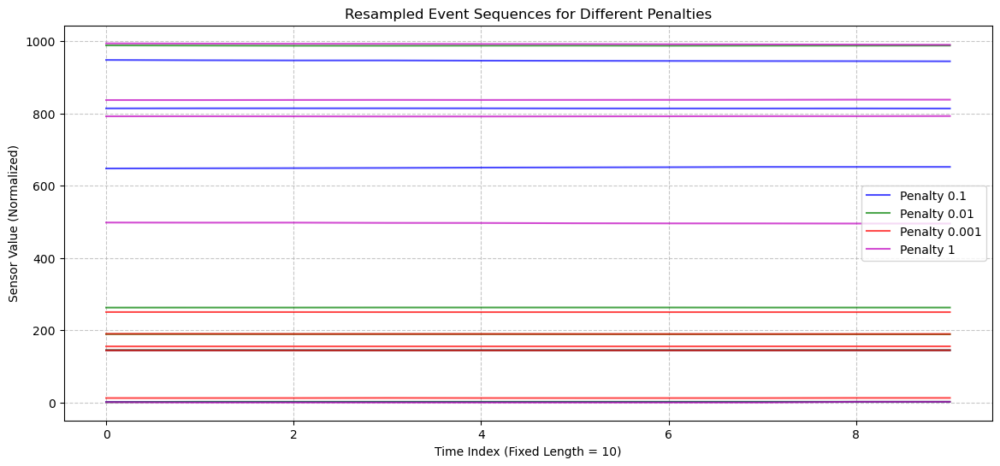

In [51]:
import matplotlib.pyplot as plt
import random

def plot_resampled_events(resampled_data, penalties, num_samples=5):
    plt.figure(figsize=(14, 6))
    colors = ['b', 'g', 'r', 'm']  # Different colors for penalties

    for i, penalty in enumerate(penalties):
        if penalty not in resampled_data or len(resampled_data[penalty]) == 0:
            print(f"No resampled events available for penalty {penalty}.")
            continue

        # Select random samples to plot
        samples = random.sample(resampled_data[penalty], min(num_samples, len(resampled_data[penalty])))

        for sample in samples:
            plt.plot(sample, linestyle='-', alpha=0.7, color=colors[i], label=f"Penalty {penalty}" if sample is samples[0] else "")

    # Formatting
    plt.xlabel("Time Index (Fixed Length = 10)")
    plt.ylabel("Sensor Value (Normalized)")
    plt.title("Resampled Event Sequences for Different Penalties")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

# Example usage:
plot_resampled_events(resampled_data, penalties, num_samples=5)


Resampled Events for Penalty 0.1:
[522.8467, 522.8860, 522.8467, 522.9645, 523.4748, 523.8673, 524.1028, 524.2206, 524.4954, 524.0636],
[524.1028, 523.7496, 523.4355, 523.0430, 522.7290, 522.6505, 522.6897, 522.6897, 522.6505, 522.6897],
[522.7290, 522.5327, 522.8860, 523.4355, 523.6710, 523.7496, 523.8281, 524.2598, 524.1421, 524.2598],
[524.6523, 524.3383, 524.5346, 524.2991, 524.2991, 524.2206, 524.4561, 524.4561, 524.8486, 525.3982],
[525.5159, 525.9084, 525.9084, 525.7122, 525.3982, 525.5944, 525.7122, 525.6729, 525.5944, 525.5944],
[525.5159, 525.1234, 525.2019, 525.2411, 524.8094, 524.4561, 524.0243, 523.9458, 523.8281, 523.8281],
[524.1421, 524.3383, 524.6131, 524.6916, 524.4561, 524.7309, 524.6916, 525.0842, 525.2411, 525.5159],
[526.0262, 526.8898, 527.3608, 527.7534, 528.2244, 528.0281, 527.4393, 527.3608, 526.8113, 525.8692],
[525.0842, 524.8879, 524.4561, 524.1028, 524.0636, 523.8673, 523.4748, 523.3177, 523.4355, 523.0823],
[523.1608, 523.2393, 523.5140, 523.8673, 524.220

C:\Users\gutti\AppData\Local\Temp\ipykernel_20852\2108896301.py:41: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(plot_path)
C:\softwares\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


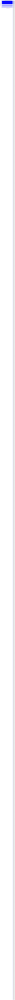

Plot saved at: C:/Users/gutti/OneDrive/Documents/Project/Subsequences/event modelling.csv\resampled_events_penalty_0_1.png


In [53]:
import matplotlib.pyplot as plt
import os

def print_and_plot_resampled_events_penalty_0_1(resampled_data, output_folder):
    """
    Prints and plots resampled event sequences only for penalty = 0.01 and saves the plot.

    :param resampled_data: Dictionary containing resampled event sequences for each penalty.
    :param output_folder: Path to save the generated plot.
    """
    penalty = 0.1  # Selecting penalty 0.1
    if penalty not in resampled_data or len(resampled_data[penalty]) == 0:
        print(f"No resampled events available for penalty {penalty}.")
        return

    print(f"Resampled Events for Penalty 0.1:")
    for i, sample in enumerate(resampled_data[penalty]):
        print(f"[{', '.join([f'{val:.4f}' for val in sample])}],")

        #print(f"Sample {i + 1}: {sample}")  # Print each sampled event data
        

    # Ensure output directory exists
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Plot the sampled events
    plt.figure(figsize=(10, 5))
    for sample in resampled_data[penalty]:
        plt.plot(sample, linestyle='-', alpha=0.7, color='b', label="Penalty 0.1")

    # Formatting
    plt.xlabel("Time Index (Fixed Length = 10)")
    plt.ylabel("Sensor Value (Normalized)")
    plt.title("Resampled Event Sequences for Penalty = 0.1")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Save plot
    plot_path = os.path.join(output_folder, "resampled_events_penalty_0_1.png")
    plt.savefig(plot_path)
    plt.show()
    print(f"Plot saved at: {plot_path}")
    

# Example usage:
output_folder = "C:/Users/gutti/OneDrive/Documents/Project/Subsequences/event modelling.csv"
print_and_plot_resampled_events_penalty_0_1(resampled_data, output_folder)
